# LLaMA Factory Colab Tutorial

Please use a **free** Tesla T4 Colab GPU to run this!

Project homepage: https://github.com/hiyouga/LLaMA-Factory

## Install Dependencies

For doing inference on the finetuned model


In [ ]:
%pip install peft

In [ ]:
%pip install -i https://pypi.org/simple/ bitsandbytes

Looking in indexes: https://pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 MB 18.2 MB/s eta 0:00:00


In [ ]:
from transformers import LlamaForSequenceClassification

peft_model_id = "/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-06-07-ad/checkpoint-300"
#model_name_or_path = "OldBirdAZ/itab-llm"
model_id="unsloth/llama-3-8b-Instruct-bnb-4bit"
#model = LlamaForSequenceClassification.from_pretrained(
 #   model_id,
  #  num_labels=2
#)



In [ ]:
from peft import PeftModel
model = PeftModel.from_pretrained(model, peft_model_id, adapter_name="ad_instruct")

NameError: name 'model' is not defined

In [ ]:

%pip install --upgrade transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 73.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 76.9 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.19.1
    Uninstalling tokenizers-0.19.1:
      Successfully uninstalled tokenizers-0.19.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.44.2
    Uninstalling transformers-4.44.2:
      Successfully uninstalled transformers-4.44.2


In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM
peft_model_id="/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-09-12-diabetes"
model=AutoModelForCausalLM.from_pretrained(peft_model_id)
tokenizer = AutoTokenizer.from_pretrained(peft_model_id)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.45k [00:00<?, ?B/s]

Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


model.safetensors:   0%|          | 0.00/5.70G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/234 [00:00<?, ?B/s]

In [ ]:
import numpy as np
import bigjson
import json
import torch
import torch.nn.functional as F
import re
decrease_answer=[]
not_answer=[]
decrease_prob=[]
not_prob=[]
#json_filepath="/content/drive/MyDrive/ad_test_baseline_generation_Jul_15.json"
data_for_json = []
with open('/content/drive/MyDrive/LLaMA-Factory/data/habs_hd_data_baseline_Aug_18.json', 'rb') as f:

    json_data = bigjson.load(f)
    for i, data in enumerate(json_data):

        # if i <=251:
        #    continue
        json_filepath="/content/drive/MyDrive/habs_baseline_Aug_18_generation_LORA-16-32_habs_summary.json"
        dict_data = data.to_python()
        value=extract_values(dict_data["output"])
        abeta_status=value["Abeta accumulation status"]
        abeta_rate=value["Abeta accumulation rate"]
        ec_status=value["EC ROIs tau accumulation"]
        ec_rate=value["EC ROIs future tau increase likelihood"]
        meta_status=value["Meta ROIs tau accumulation"]
        meta_rate=value["Meta ROIs future tau increase likelihood"]
        mmse_rate=value["MMSE score decrease rate"]
        if abeta_status=="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
            }
            calculate_probability_new(outputs,generated_tokens,i,"other_unknown_mmse")
        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_ec_tau")
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"abeta_unknown_other_known_ec_tau")

            indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_tau = tokenizer.decode(values_before_8)
                inputs = tokenizer(
                    [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"abeta_unknown_other_known_mmse")

                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status!="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"all_known_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_new = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+ decoded_text_new+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"all_known_ec_tau")
                indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_new_tau = tokenizer.decode(values_before_8)
                    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                     "Abeta: This"+ decoded_text_new+"EC tau: This"+decoded_text_new_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]

                    entry = {
                     "instruction":  instruction_llm,
                    "input":dict_data["input"],
                    "output": "Abeta: This"+ decoded_text_new+"EC tau: This"+decoded_text_new_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                    "index":i
                }
                    calculate_probability_new(outputs,generated_tokens,i,"all_known_mmse")

        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"tau_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_rate = tokenizer.decode(values_before_8)
                inputs = tokenizer(
                [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_rate+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_rate+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                calculate_probability_new(outputs,generated_tokens,i,"tau_unknown_mmse")
        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_abeta")

            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
        if abeta_status!="Unknown" and ec_status!="Unknown" and meta_status!="Unknown" and mmse_rate=="Unknown":


            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
              first_occurrence = indices[0]
              row= first_occurrence.item()
              values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
              decoded_text_abeta= tokenizer.decode(values_before_8)

              inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_abeta+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
              outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
              transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
              input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
              generated_tokens = outputs.sequences[:, input_length:]
              calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_ec_tau")
              entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_abeta+"EC tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
        data_for_json.append(entry)
        print(entry["output"])
        with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
            json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)
        # logits = outputs.scores[27]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        # logits = outputs.scores[26]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        #print(tokenizer.decode(generated_tokens.cpu()[0]))
       # for tok, score in zip(generated_tokens.cpu()[0], transition_scores.cpu()[0]):
          # | token | token string | log probability | probability
        #   print(f"| {tok:5d} | {tokenizer.decode(tok):8s} | {score.numpy():.3f} | {np.exp(score.numpy()):.2%}")
          #  if tokenizer.decode(tok)=="No" or tokenizer.decode(tok)=="Yes":
          #     answer.append(tokenizer.decode(tok))
          #     probability.append(np.exp(score.numpy()))


Streaming output truncated to the last 5000 lines.
{'ĠNegative': [(3, 0.6650508046150208)], 'ĠIntermediate': [(3, 0.12892597913742065), (27, 0.31137093901634216), (51, 0.4814741313457489)], 'ĠWeak': [], 'ĠClearly': [(3, 0.20602312684059143)], 'ĠUnknown': [(12, 0.20097514986991882), (72, 1.0)], 'ĠSlow': [(18, 0.2547806203365326), (82, 0.43969962000846863)], 'ĠModerate': [(18, 0.2978686988353729), (82, 0.4632069170475006)], 'ĠFast': [(18, 0.22367534041404724)], 'ĠZero': [(18, 0.22367534041404724), (82, 0.09709344804286957)], 'ĠVery': [(27, 0.10987210273742676), (51, 0.10092245787382126)], 'ĠLow': [(27, 0.09397858381271362), (51, 0.26451432704925537)], 'ĠHigh': [(27, 0.48477843403816223), (51, 0.15308915078639984)], 'ĠSuper': [], 'ĠPossibly': [(39, 0.7132982015609741), (63, 0.6394362449645996)], 'ĠUn': [(39, 0.2867017388343811), (63, 0.3605637848377228)], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}
{'ĠNegative': [], 'ĠIntermediate': [(2, 0.30838125944137573)], 'ĠWeak': [], 'ĠClearly': [], 'Ġ

In [ ]:
import numpy as np
import bigjson
import json
import torch
import torch.nn.functional as F
import re
decrease_answer=[]
not_answer=[]
decrease_prob=[]
not_prob=[]
#json_filepath="/content/drive/MyDrive/ad_test_baseline_generation_Jul_15.json"
data_for_json = []
with open('/content/drive/MyDrive/LLaMA-Factory/data/habs_hd_data_baseline_Aug_18.json', 'rb') as f:

    json_data = bigjson.load(f)
    for i, data in enumerate(json_data):

        # if i <=251:
        #    continue
        json_filepath="/content/drive/MyDrive/habs_baseline_Aug_18_generation_LORA-16-32_habs_summary.json"
        dict_data = data.to_python()
        value=extract_values(dict_data["output"])
        abeta_status=value["Abeta accumulation status"]
        abeta_rate=value["Abeta accumulation rate"]
        ec_status=value["EC ROIs tau accumulation"]
        ec_rate=value["EC ROIs future tau increase likelihood"]
        meta_status=value["Meta ROIs tau accumulation"]
        meta_rate=value["Meta ROIs future tau increase likelihood"]
        mmse_rate=value["MMSE score decrease rate"]
        if abeta_status=="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
            }
            calculate_probability_new(outputs,generated_tokens,i,"other_unknown_mmse")
        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_ec_tau")
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"abeta_unknown_other_known_ec_tau")

            indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_tau = tokenizer.decode(values_before_8)
                inputs = tokenizer(
                    [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"abeta_unknown_other_known_mmse")

                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status!="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"all_known_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_new = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+ decoded_text_new+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"all_known_ec_tau")
                indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_new_tau = tokenizer.decode(values_before_8)
                    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                     "Abeta: This"+ decoded_text_new+"EC tau: This"+decoded_text_new_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]

                    entry = {
                     "instruction":  instruction_llm,
                    "input":dict_data["input"],
                    "output": "Abeta: This"+ decoded_text_new+"EC tau: This"+decoded_text_new_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                    "index":i
                }
                    calculate_probability_new(outputs,generated_tokens,i,"all_known_mmse")

        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"tau_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_rate = tokenizer.decode(values_before_8)
                inputs = tokenizer(
                [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_rate+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_rate+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                calculate_probability_new(outputs,generated_tokens,i,"tau_unknown_mmse")
        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_abeta")

            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
        if abeta_status!="Unknown" and ec_status!="Unknown" and meta_status!="Unknown" and mmse_rate=="Unknown":


            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
              first_occurrence = indices[0]
              row= first_occurrence.item()
              values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
              decoded_text_abeta= tokenizer.decode(values_before_8)

              inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_abeta+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
              outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
              transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
              input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
              generated_tokens = outputs.sequences[:, input_length:]
              calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_ec_tau")
              entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_abeta+"EC tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
        data_for_json.append(entry)
        print(entry["output"])
        with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
            json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)
        # logits = outputs.scores[27]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        # logits = outputs.scores[26]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        #print(tokenizer.decode(generated_tokens.cpu()[0]))
       # for tok, score in zip(generated_tokens.cpu()[0], transition_scores.cpu()[0]):
          # | token | token string | log probability | probability
        #   print(f"| {tok:5d} | {tokenizer.decode(tok):8s} | {score.numpy():.3f} | {np.exp(score.numpy()):.2%}")
          #  if tokenizer.decode(tok)=="No" or tokenizer.decode(tok)=="Yes":
          #     answer.append(tokenizer.decode(tok))
          #     probability.append(np.exp(score.numpy()))


Streaming output truncated to the last 5000 lines.
{'ĠNegative': [(3, 0.6650508046150208)], 'ĠIntermediate': [(3, 0.12892597913742065), (27, 0.31137093901634216), (51, 0.4814741313457489)], 'ĠWeak': [], 'ĠClearly': [(3, 0.20602312684059143)], 'ĠUnknown': [(12, 0.20097514986991882), (72, 1.0)], 'ĠSlow': [(18, 0.2547806203365326), (82, 0.43969962000846863)], 'ĠModerate': [(18, 0.2978686988353729), (82, 0.4632069170475006)], 'ĠFast': [(18, 0.22367534041404724)], 'ĠZero': [(18, 0.22367534041404724), (82, 0.09709344804286957)], 'ĠVery': [(27, 0.10987210273742676), (51, 0.10092245787382126)], 'ĠLow': [(27, 0.09397858381271362), (51, 0.26451432704925537)], 'ĠHigh': [(27, 0.48477843403816223), (51, 0.15308915078639984)], 'ĠSuper': [], 'ĠPossibly': [(39, 0.7132982015609741), (63, 0.6394362449645996)], 'ĠUn': [(39, 0.2867017388343811), (63, 0.3605637848377228)], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}
{'ĠNegative': [], 'ĠIntermediate': [(2, 0.30838125944137573)], 'ĠWeak': [], 'ĠClearly': [], 'Ġ

In [ ]:
tokenizer.pad_token = tokenizer.eos_token
model.config.pad_token_id = model.config.eos_token_id

In [ ]:
tokenizer.pad_token

'<|eot_id|>'

In [ ]:
tokenizer.eos_token

In [ ]:
alpaca_prompt = """Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.

### Instruction:
{}

### Input:
{}

### Response:
{}"""

EOS_TOKEN = tokenizer.eos_token # Must add EOS_TOKEN
def formatting_prompts_func(examples):
    instructions = examples["system"]
    inputs       = examples["user"]
    outputs      = examples["completion"]
    texts = []
    for instruction, input, output in zip(instructions, inputs, outputs):
        # Must add EOS_TOKEN, otherwise your generation will go on forever!
        text = alpaca_prompt.format(instruction, input, output) + EOS_TOKEN
        texts.append(text)
    return { "text" : texts, }
pass

#from datasets import load_dataset
#dataset = load_dataset("yahma/alpaca-cleaned", split = "train")
#dataset = dataset.map(formatting_prompts_func, batched = True,)

In [ ]:
%pip install bigjson

In [ ]:
import bigjson
import torch
texts=[]
labels=[]
with open('/content/drive/MyDrive/LLaMA-Factory/data/ad_train_data_serialization.json', 'rb') as f:
    json_data = bigjson.load(f)
    for i, data in enumerate(json_data):
        if i%100==0:
          print(i)
        dict_data = data.to_python()
        texts.append(alpaca_prompt.format(
                    dict_data["system"], # instruction
                    dict_data["user"], # input
                    "", # output - leave this blank for generation!
                    ))
        if dict_data['completion']=='No':
            labels.append(0)
        else:
            labels.append(1)
labels=torch.tensor(labels)

In [ ]:
texts

["Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.\n\n### Instruction:\nAs a Question Answering agent, your goal is to predict whether the input patient will have a positive beta amyloid-PET (Positron emission tomography) scan based on their health records, including demographic characteristics, genetic information, blood test results, MRI neuroimaging results, and cognitive testing scores.  So that the prediction can be utilized in later stages of diagnosis. Following are the classes of whether having a positive beta amyloid-PET scan [Yes, No]. \n\n### Input:\nClassify the following patient into one of the above classes. Please answer in a single word. Patient's record:The patient is a 76  year-old Male and the marital status is Married, with 20 years of education, a self-identified race White, ethinicity Not Hisp/Latino, with  one APOE4 allele.  In cognitive testing, for clini

In [ ]:
import torch
from torch.optim import AdamW
from torch.utils.data import DataLoader, TensorDataset
import torch.nn.functional as F
inputs = tokenizer(texts, padding=True, return_tensors="pt") # Replace with actual labels

# Create TensorDataset and DataLoader
dataset = TensorDataset(inputs['input_ids'], inputs['attention_mask'], labels)
batch_size = 8  # Define your batch size
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Define optimizer
optimizer = AdamW(model.parameters(),lr=2e-5,weight_decay = 0.01)
# Training loop (simplified)
model.train()
for epoch in range(3):  # Example: 3 epochs
    for batch in dataloader:
        input_ids, attention_mask, labels = batch
        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        with autocast():
          logits = model(input_ids, attention_mask)
          loss = F.cross_entropy(logits, labels) / accumulation_steps

        scaler.scale(loss).backward()

        # Backward pass, optimization step, and learning rate adjustment
        if not batch_idx % accumulation_steps:
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
            optimizer.zero_grad()

        # Logging training progress after 100 steps
        if not (batch_idx + 1) % 100:
            print(
                f'Epoch: {epoch+1} / {num_epochs}'
                f'| Batch: {batch_idx+1}/{len(train_dataloader)}'
                f'| Loss: {loss.item():.4f}'
            )

RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

In [ ]:
outputs.sequences

AttributeError: 'SequenceClassifierOutputWithPast' object has no attribute 'sequences'

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.70 GiB. GPU 

In [ ]:
outputs

SequenceClassifierOutputWithPast(loss=tensor(0.8647, dtype=torch.float16), logits=tensor([[ 2.6562,  0.9282],
        [ 5.3750,  0.9351],
        [ 4.3984, -0.2751],
        [ 3.8730,  0.9956],
        [ 2.9082,  3.2910],
        [ 0.8428, -0.4033],
        [ 3.5547,  0.9146],
        [ 2.8691,  0.0676]], dtype=torch.float16), past_key_values=((tensor([[[[ 5.3125e-01,  1.0312e+00,  9.9609e-01,  ...,  1.2500e+00,
           -2.5195e-01,  1.8457e-01],
          [ 1.2930e+00, -2.8320e-02,  1.0742e-02,  ..., -6.7969e-01,
           -1.0547e+00, -1.1953e+00],
          [-3.4023e+00, -1.9824e+00, -1.9414e+00,  ...,  2.4902e-01,
           -1.4453e+00, -1.1641e+00],
          ...,
          [-3.7715e+00, -1.1680e+00,  6.1426e-01,  ..., -1.0490e-03,
           -5.0146e-01, -6.1816e-01],
          [-9.0723e-01,  3.3643e-01, -1.6162e-01,  ..., -1.0519e-03,
           -5.0146e-01, -6.1816e-01],
          [ 2.7930e+00,  1.6299e+00, -8.6963e-01,  ..., -1.0548e-03,
           -5.0146e-01, -6.1816e-0

In [ ]:
torch.cuda.empty_cache()

In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer, BitsAndBytesConfig
peft_model_id = "/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-06-07-ad/checkpoint-300"
model = AutoModelForCausalLM.from_pretrained(peft_model_id, quantization_config=BitsAndBytesConfig(load_in_4bit=True),return_dict_in_generate=True, output_scores=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
/usr/local/lib/python3.10/dist-p

In [ ]:
tokenizer = AutoTokenizer.from_pretrained(peft_model_id)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
alpaca_prompt = """Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.

### Instruction:
{}

### Input:
{}

### Response:
{}"""
EOS_TOKEN = tokenizer.eos_token # Must add EOS_TOKEN
def formatting_prompts_func(examples):
    instructions = examples["instruction"]
    inputs       = examples["input"]
    outputs      = examples["output"]
    texts = []
    for instruction, input, output in zip(instructions, inputs, outputs):
        # Must add EOS_TOKEN, otherwise your generation will go on forever!
        text = alpaca_prompt.format(instruction, input, output) + EOS_TOKEN
        texts.append(text)
    return { "text" : texts, }
pass



In [ ]:
%pip install bigjson

In [ ]:
inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["system"], # instruction
                    dict_data["user"], # input
                    "", # output - leave this blank for generation!
                    ),alpaca_prompt.format(
                    dict_data["system"], # instruction
                    dict_data["user"], # input
                    "", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt")

In [ ]:
outputs= model.generate(**inputs, max_new_tokens = 64, use_cache = True)

Setting `pad_token_id` to `eos_token_id`:128009 for open-end generation.
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1659: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(


In [ ]:
transition_scores=model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )

In [ ]:
generated_tokens = outputs.sequences[:, input_length:]

In [ ]:
transition_scores

tensor([[-0.5625, -0.0013],
        [-0.5625, -0.0013]])

In [ ]:
import math
pos_logits=[]
neg_logits=[]
for tok, score in zip(generated_tokens.cpu()[:,0], transition_scores.cpu()[:,0]):
          # | token | token string | log probability | probability
           #print(f"| {tok:5d} | {tokenizer.decode(tok):8s} | {score.numpy():.3f} | {np.exp(score.numpy()):.2%}")
           if tokenizer.decode(tok)=="No":
              neg_logits.append(score)
              pos_logits.append(math.log(1-math.exp(score)))
           else:
              neg_logits.append(math.log(1-math.exp(score)))
              pos_logits.append(score)


In [ ]:
import torch
torch.tensor(pos_logits)
torch.tensor(neg_logits)

tensor([-0.8435, -0.8435])

In [ ]:
 logits=torch.stack((torch.tensor(neg_logits), torch.tensor(pos_logits)), dim=1)

In [ ]:
logits.view(-1, 2)

tensor([[-0.8435, -0.5625],
        [-0.8435, -0.5625]])

In [ ]:
for tok, score in zip(generated_tokens.cpu()[0], transition_scores.cpu()[0]):
          # | token | token string | log probability | probability
           print(f"| {tok:5d} | {tokenizer.decode(tok):8s} | {score.numpy():.3f} | {np.exp(score.numpy()):.2%}")
           if tokenizer.decode(tok)=="No" or tokenizer.decode(tok)=="Yes":
            print("yes")

|  9642 | Yes      | -0.562 | 56.98%
yes
| 128009 | <|eot_id|> | -0.001 | 99.87%


In [ ]:
def calculate_probability(outputs, abeta_answer, tau_answer,generated_tokens,i,tail=""):
  scores = outputs.scores
  from torch.nn.functional import softmax
  top_k = 10  # Define the number of top tokens to consider
  probabilities = [softmax(score, dim=-1) for score in scores]
  generated_tokens = tokenizer.convert_ids_to_tokens(generated_tokens[0])
  import torch
  top_k_tokens_and_probs = []
  for position_probs in probabilities:
    top_k_probs, top_k_indices = torch.topk(position_probs[0], top_k)
    top_k_tokens = tokenizer.convert_ids_to_tokens(top_k_indices.tolist())
    top_k_tokens_and_probs.append(list(zip(top_k_tokens, top_k_probs.tolist()))) # all top 10 tokens in each generated positions

  if abeta_answer=="Unknown" and tau_answer=="Unknown":
    expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  if abeta_answer!="Unknown" and tau_answer=="Unknown":
    expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","ĠModerate","Ġaccumulating","ĠClearly", "ĠIntermediate", "ĠWeak", "ĠNegative","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  if abeta_answer=="Unknown" and tau_answer!="Unknown":
    expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","ĠModerate","Ġaccumulating", "ĠIntermediate","ĠLow","ĠVery","ĠHigh","ĠSuper","Ġincreasing","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  if abeta_answer!="Unknown" and tau_answer!="Unknown":
    expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","ĠModerate","Ġaccumulating","ĠClearly", "ĠIntermediate", "ĠWeak", "ĠNegative", "ĠLow","ĠHigh","ĠSuper","Ġincreasing","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  expected_token_ids = [tokenizer.convert_tokens_to_ids(token) for token in expected_tokens]

  token_probabilities = {token: [] for token in expected_tokens}

  for idx, token_prob_list in enumerate(top_k_tokens_and_probs):
    for token, prob in token_prob_list:
        if token in expected_tokens:
            token_probabilities[token].append((idx, prob))
  import json
  # Specify the file path
  file_path = f'/content/drive/MyDrive/ADNI_Baseline_infer_Aug_18_new/output_{i}'+tail+'.json'
  with open(file_path, 'w') as json_file:
    json.dump(token_probabilities, json_file, indent=4)
  return 0

In [ ]:
import numpy as np
import bigjson
import json
import torch
import torch.nn.functional as F
import re
decrease_answer=[]
not_answer=[]
decrease_prob=[]
not_prob=[]
#json_filepath="/content/drive/MyDrive/ad_test_baseline_generation_Jul_15.json"
data_for_json = []
with open('/content/drive/MyDrive/LLaMA-Factory/data/ad_baseline_visit_test_Aug_18_new.json', 'rb') as f:

    json_data = bigjson.load(f)
    for i, data in enumerate(json_data):

        json_filepath="/content/drive/MyDrive/ad_baseline_Aug_18_genertration_new.json"
        # if i!=1190 and i!=2095:
        #   continue
        # print(i)
        if i<=4211:
          continue
          # with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
          #   json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)
        dict_data = data.to_python()
        # Define regular expressions for each part
        abeta_pattern = r"Abeta:\s*([^\.\n]*)"
        tau_pattern = r"Tau:\s*([^\.\n]*)"
        mmse_pattern = r"MMSE:\s*([^\.\n]*)"
        abeta_match = re.search(abeta_pattern, dict_data["output"])
        tau_match = re.search(tau_pattern, dict_data["output"])
        mmse_match = re.search(mmse_pattern, dict_data["output"])
        abeta_answer = abeta_match.group(1).strip() if abeta_match else "Not found"
        tau_answer = tau_match.group(1).strip() if tau_match else "Not found"
        mmse_answer = mmse_match.group(1).strip() if mmse_match else "Not found"
        if abeta_answer=="Unknown" and tau_answer=="Unknown":
           inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["instruction"], # instruction
                    dict_data["input"], # input
                    "", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
           outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
           transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
           input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
           generated_tokens = outputs.sequences[:, input_length:]
           entry = {
                "instruction":  dict_data["instruction"],
                "input":dict_data["input"],
                "output": ""+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
            }
           calculate_probability(outputs, abeta_answer, tau_answer,generated_tokens,i)
        if abeta_answer!="Unknown" and tau_answer=="Unknown":
           print(i)
           inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["instruction"], # instruction
                    dict_data["input"], # input
                    "Abeta: This ", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
           outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
           transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
           input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
           generated_tokens = outputs.sequences[:, input_length:]
           entry = {
                "instruction":  dict_data["instruction"],
                "input":dict_data["input"],
                "output": "Abeta: This "+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
            }
           calculate_probability(outputs, abeta_answer, tau_answer,generated_tokens,i)
        if abeta_answer=="Unknown" and tau_answer!="Unknown":
           inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["instruction"], # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown.\n Tau: In ", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
           outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
           transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
           input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
           generated_tokens = outputs.sequences[:, input_length:]
           entry = {
                "instruction":  dict_data["instruction"],
                "input":dict_data["input"],
                "output": "Abeta: Unknown.\n Tau: In "+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
           calculate_probability(outputs, abeta_answer, tau_answer,generated_tokens,i)

        if abeta_answer!="Unknown" and tau_answer!="Unknown":
           print(i)
           inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["instruction"], # instruction
                    dict_data["input"], # input
                    "Abeta: This ", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
           outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
           transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
           input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
           generated_tokens = outputs.sequences[:, input_length:]
           calculate_probability(outputs, abeta_answer, "Unknown",generated_tokens,i,"abeta")
           indices = (generated_tokens.cpu()[0] == tokenizer("Tau")["input_ids"][1]).nonzero(as_tuple=False)
           if len(indices)==0:
             indices = (generated_tokens.cpu()[0] == tokenizer(" Tau")["input_ids"][1]).nonzero(as_tuple=False)
           if len(indices) > 0:
             first_occurrence = indices[0]
             row= first_occurrence.item()
             values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
             decoded_text = tokenizer.decode(values_before_8)
             inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["instruction"], # instruction
                    dict_data["input"], # input
                    "Abeta: This "+decoded_text+"Tau: In ", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
             outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
             transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
             input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
             generated_tokens = outputs.sequences[:, input_length:]
             entry = {
                "instruction":  dict_data["instruction"],
                "input":dict_data["input"],
                "output": "Abeta: This "+decoded_text+"Tau: In "+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
             calculate_probability(outputs, "Unknown", tau_answer,generated_tokens,i,"tau")
        data_for_json.append(entry)
        print(entry["output"])
        with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
          json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)
        # logits = outputs.scores[27]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        # logits = outputs.scores[26]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        #print(tokenizer.decode(generated_tokens.cpu()[0]))
       # for tok, score in zip(generated_tokens.cpu()[0], transition_scores.cpu()[0]):
          # | token | token string | log probability | probability
        #   print(f"| {tok:5d} | {tokenizer.decode(tok):8s} | {score.numpy():.3f} | {np.exp(score.numpy()):.2%}")
          #  if tokenizer.decode(tok)=="No" or tokenizer.decode(tok)=="Yes":
          #     answer.append(tokenizer.decode(tok))
          #     probability.append(np.exp(score.numpy()))


KeyboardInterrupt: 

In [ ]:
# "Abeta accumulation status": abeta_status,
#         "Abeta accumulation rate": abeta_rate,
#         "EC ROIs tau accumulation": ec_tau,
#         "EC ROIs future tau increase likelihood": ec_increase,
#         "Meta ROIs tau accumulation": meta_tau,
#         "Meta ROIs future tau increase likelihood": meta_increase,
#         "MMSE score decrease rate": mmse_rate

def calculate_probability_new(outputs, generated_tokens,i,tail=""):
  scores = outputs.scores
  from torch.nn.functional import softmax
  top_k = 20  # Define the number of top tokens to consider
  probabilities = [softmax(score, dim=-1) for score in scores]
  generated_tokens = tokenizer.convert_ids_to_tokens(generated_tokens[0])
  import torch
  top_k_tokens_and_probs = []
  for position_probs in probabilities:
    top_k_probs, top_k_indices = torch.topk(position_probs[0], top_k)
    top_k_tokens = tokenizer.convert_ids_to_tokens(top_k_indices.tolist())
    top_k_tokens_and_probs.append(list(zip(top_k_tokens, top_k_probs.tolist()))) # all top 10 tokens in each generated positions
  expected_tokens=["ĠNegative", "ĠIntermediate", "ĠWeak", "ĠClearly", "ĠUnknown", "ĠSlow", "ĠModerate", "ĠFast", "ĠZero", "ĠVery", "ĠLow", "ĠHigh", "ĠSuper", "ĠPossibly", "ĠUn","Ġlikely","ĠPoss","Ġibly" ]
  # if abeta_answer=="Unknown" and tau_answer=="Unknown":
  #   expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  # if abeta_answer!="Unknown" and tau_answer=="Unknown":
  #   expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","ĠModerate","Ġaccumulating","ĠClearly", "ĠIntermediate", "ĠWeak", "ĠNegative","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  # if abeta_answer=="Unknown" and tau_answer!="Unknown":
  #   expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","ĠModerate","Ġaccumulating", "ĠIntermediate","ĠLow","ĠVery","ĠHigh","ĠSuper","Ġincreasing","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  # if abeta_answer!="Unknown" and tau_answer!="Unknown":
  #   expected_tokens = ["ĠExtremely", "ĠFast", "ĠSlow", "ĠVery","Ġto","Ġnot","ĠModerate","Ġaccumulating","ĠClearly", "ĠIntermediate", "ĠWeak", "ĠNegative", "ĠLow","ĠHigh","ĠSuper","Ġincreasing","Ġextremely", "Ġfast", "Ġslow","Ġvery"]
  expected_token_ids = [tokenizer.convert_tokens_to_ids(token) for token in expected_tokens]

  token_probabilities = {token: [] for token in expected_tokens}

  for idx, token_prob_list in enumerate(top_k_tokens_and_probs):
    for token, prob in token_prob_list:
        if token in expected_tokens:
            token_probabilities[token].append((idx, prob))
  import json
  # Specify the file path
  file_path = f'/content/drive/MyDrive/adni_multiple_visits_summary/output_{i}'+tail+'.json'
  print(token_probabilities)
  with open(file_path, 'w') as json_file:
    json.dump(token_probabilities, json_file, indent=4)
  return 0

In [ ]:
tokenizer("MMSE")["input_ids"][1]

8195

In [ ]:
tokenizer.decode(14617)

'likely'

In [ ]:
import re

def extract_values(text):
    # Define the pattern for each segment
    abeta_status_pattern = r"is in (Clearly positive|Weakly positive|Intermediate negative|Negative|Unknown) abeta accumulation status"
    abeta_rate_pattern = r"and has a (Slow|Moderate|Fast|Zero|Unknown) accumulation rate"
    ec_tau_pattern = r"In EC ROIs, this patient has (Very low|Low|Intermediate|High|Super high|Unknown) tau accumulation"
    ec_increase_pattern = r"and is (Possibly|Unlikely|Unknown) to experience further increase"
    meta_tau_pattern = r"In meta ROIs, this patient has (Very low|Low|Intermediate|High|Super high|Unknown) tau accumulation"
    meta_increase_pattern = r"and is (Possibly|Unlikely|Unknown) to experience further increase"
    mmse_rate_pattern = r"The MMSE score is expected to decrease at a (Slow|Moderate|Fast|Zero|Unknown) rate"

    # Helper function to safely extract groups
    def safe_extract(pattern, text):
        match = re.search(pattern, text)
        return match.group(1) if match else "Not found"

    # Extract values using the helper function
    abeta_status = safe_extract(abeta_status_pattern, text)
    abeta_rate = safe_extract(abeta_rate_pattern, text)
    ec_tau = safe_extract(ec_tau_pattern, text)
    ec_increase = safe_extract(ec_increase_pattern, text)
    meta_tau = safe_extract(meta_tau_pattern, text)
    meta_increase = safe_extract(meta_increase_pattern, text)
    mmse_rate = safe_extract(mmse_rate_pattern, text)

    # Store the extracted values in a dictionary
    extracted_values = {
        "Abeta accumulation status": abeta_status,
        "Abeta accumulation rate": abeta_rate,
        "EC ROIs tau accumulation": ec_tau,
        "EC ROIs future tau increase likelihood": ec_increase,
        "Meta ROIs tau accumulation": meta_tau,
        "Meta ROIs future tau increase likelihood": meta_increase,
        "MMSE score decrease rate": mmse_rate
    }

    return extracted_values
# Example usage
#generated_answer = "This patient is in Negative abeta accumulation status and has a Unknown accumulation rate. In EC ROIs, this patient has Very low tau accumulation and is Unknown to experience further increase. In meta ROIs, this patient has Very low tau accumulation and is Unknown to experience further increase. The MMSE score is expected to decrease at a Unknown rate"

#extracted_values = extract_values(generated_answer)
#for key, value in extracted_values.items():
    #print(f"{key}: {value}")


In [ ]:
instruction_llm="As an expert in diagnosing and predicting the disease stage for Alzheimer's disease patients, your task is to forecast a patient's amyloid-beta (abeta) accumulation status and change rate, tau accumulation status and change rate in the entorhinal cortex (EC) and meta regions of interest (ROIs), and Mini-Mental State Examination (MMSE) score change rate. The prediction should follow this format: Abeta: Unknown or This patient is in [Negative/Intermediate negative/Weakly positive/Clearly positive] accumulation status. Abeta rate: Unknown or The abeta accumulation has a [Slow/Moderate/Fast/Zero] rate. EC tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation. EC tau rate: Unknown or The tau accumulation is [Possibly/Unlikely] to experience further increase. Meta tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation. Meta tau rate: Unknown or The tau accumulation is  [Possibly/Unlikely] to experience further increase. MMSE: Unknown or The score is expected to decrease at a [Slow/Moderate/Fast/Zero] rate."


In [ ]:
instruction_llm

"As an expert in diagnosing and predicting the disease stage for Alzheimer's disease patients, your task is to forecast a patient's amyloid-beta (abeta) accumulation status and change rate, tau accumulation status and change rate in the entorhinal cortex (EC) and meta regions of interest (ROIs), and Mini-Mental State Examination (MMSE) score change rate. The prediction should follow this format: Abeta: Unknown or This patient is in [Negative/Intermediate negative/Weakly positive/Clearly positive] accumulation status. Abeta rate: Unknown or The abeta accumulation has a [Slow/Moderate/Fast/Zero] rate. EC tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation. EC tau rate: Unknown or The tau accumulation is [Possibly/Unlikely] to experience further increase. Meta tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation. Meta tau rate: Unknown or The tau accumulation is  [Possibly/Unlikely] to experience further in

In [ ]:
extract_values("This patient is in Clearly positive abeta accumulation status and has a Unknown accumulation rate. In EC ROIs, this patient has Super high tau accumulation and is Unknown to experience further increase. In meta ROIs, this patient has Super high tau accumulation and is Unknown to experience further increase. The MMSE score is expected to decrease at a Unknown rate.")

{'Abeta accumulation status': 'Clearly positive',
 'Abeta accumulation rate': 'Unknown',
 'EC ROIs tau accumulation': 'Super high',
 'EC ROIs future tau increase likelihood': 'Unknown',
 'Meta ROIs tau accumulation': 'Super high',
 'Meta ROIs future tau increase likelihood': 'Unknown',
 'MMSE score decrease rate': 'Unknown'}

In [ ]:
abeta_status

'Negative'

new format inference

In [ ]:
import numpy as np
import bigjson
import json
import torch
import torch.nn.functional as F
import re
decrease_answer=[]
not_answer=[]
decrease_prob=[]
not_prob=[]
#json_filepath="/content/drive/MyDrive/ad_test_baseline_generation_Jul_15.json"
data_for_json = []
with open('/content/drive/MyDrive/LLaMA-Factory/data/ad_multi_visit_Aug_18_5times_test.json', 'rb') as f:

     json_data = bigjson.load(f)
     for i, data in enumerate(json_data):
        # if i!=100 and i!=299:
        #   continue
        # if i not in [885, 1022, 1707]:
        #   continue
        json_filepath="/content/drive/MyDrive/ad_multiple_test_Aug_18_summary_generation.json"
        dict_data_ori = data.to_python()
        value=extract_values(dict_data_ori["output"])
        abeta_status=value["Abeta accumulation status"]
        abeta_rate=value["Abeta accumulation rate"]
        ec_status=value["EC ROIs tau accumulation"]
        ec_rate=value["EC ROIs future tau increase likelihood"]
        meta_status=value["Meta ROIs tau accumulation"]
        meta_rate=value["Meta ROIs future tau increase likelihood"]
        mmse_rate=value["MMSE score decrease rate"]
        with open('/content/drive/MyDrive/ad_multi_visit_Aug_18_5times_test_new_summary_ALL.json', 'rb') as f2:
          json_data_summary = bigjson.load(f2)
          for j, data_summary in enumerate(json_data_summary):
            if j==i:
              dict_data=data_summary.to_python()
              break
        if abeta_status=="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
            }
            calculate_probability_new(outputs,generated_tokens,i,"other_unknown_mmse")
        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_ec_tau")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text+"EC tau rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text+"EC tau rate: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                calculate_probability_new(outputs,generated_tokens,i,"other_unknown_ec_tau_and_rate")
        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"abeta_unknown_other_known_ec_tau")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text+"EC tau rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"abeta_unknown_other_known_ec_tau_and_rate")
                indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_tau_rate = tokenizer.decode(values_before_8)
                    inputs = tokenizer(
                    [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text+"EC tau rate: The"+decoded_text_tau_rate+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]
                    calculate_probability_new(outputs,generated_tokens,i,"abeta_unknown_other_known_mmse")

                    entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text+"EC tau rate: The"+decoded_text_tau_rate+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status!="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"all_known_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"all_known_abeta_rate")
                indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_new = tokenizer.decode(values_before_8)
                    print(decoded_text_new)
                    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+ decoded_text_new+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]
                    calculate_probability_new(outputs,generated_tokens,i,"all_known_ec_tau")
                    indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
                    if len(indices)==0:
                      indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
                    if len(indices)==0:
                      indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
                    if len(indices) > 0:
                      first_occurrence = indices[0]
                      row= first_occurrence.item()
                      values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                      decoded_text_new2 = tokenizer.decode(values_before_8)
                      inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                     "Abeta: This"+decoded_text+"Abeta rate: The"+ decoded_text_new+"EC tau: This"+decoded_text_new2+"EC tau rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                      outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                      transition_scores = model.compute_transition_scores(
                      outputs.sequences, outputs.scores, normalize_logits=True
                    )
                      input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                      generated_tokens = outputs.sequences[:, input_length:]
                      calculate_probability_new(outputs,generated_tokens,i,"all_known_ec_rate_meta_rate")
                      indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                      if len(indices)==0:
                        indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                      if len(indices)==0:
                        indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                      if len(indices)==0:
                        indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
                      if len(indices) > 0:
                        first_occurrence = indices[0]
                        row= first_occurrence.item()
                        values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                        decoded_text_new_tau = tokenizer.decode(values_before_8)
                        inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                     "Abeta: This"+decoded_text+"Abeta rate: The"+ decoded_text_new+"EC tau: This"+decoded_text_new2+"EC tau rate: The"+decoded_text_new_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                        outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                        transition_scores = model.compute_transition_scores(
                      outputs.sequences, outputs.scores, normalize_logits=True
                    )
                        input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                        generated_tokens = outputs.sequences[:, input_length:]

                        entry = {
                     "instruction":  instruction_llm,
                    "input":dict_data["input"],
                    "output": "Abeta: This"+decoded_text+"Abeta rate: The"+ decoded_text_new+"EC tau: This"+decoded_text_new2+"EC tau rate: The"+decoded_text_new_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                    "index":i
                }
                      calculate_probability_new(outputs,generated_tokens,i,"all_known_mmse")

        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"tau_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens, i,"tau_unknown_abeta_rate")
                indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                  first_occurrence = indices[0]
                  row= first_occurrence.item()
                  values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                  decoded_text_rate = tokenizer.decode(values_before_8)
                  inputs = tokenizer(
                [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_rate+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                  outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                  transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                  input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                  generated_tokens = outputs.sequences[:, input_length:]
                  entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_rate+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                  calculate_probability_new(outputs,generated_tokens,i,"tau_unknown_mmse")
        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_abeta= tokenizer.decode(values_before_8)
                inputs = tokenizer(
                [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_abeta+"Abeta rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_abeta+"Abeta rate: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                calculate_probability_new(outputs,generated_tokens,i,"other_unknown_abeta_rate")
        if abeta_status!="Unknown" and ec_status!="Unknown" and meta_status!="Unknown" and mmse_rate=="Unknown":


            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".Abeta")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text = tokenizer.decode(values_before_8)

                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta_rate")
                indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(".EC")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                  first_occurrence = indices[0]
                  row= first_occurrence.item()
                  values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                  decoded_text_abeta_rate = tokenizer.decode(values_before_8)

                  inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                  outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                  transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                  input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                  generated_tokens = outputs.sequences[:, input_length:]
                  calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_ec_tau")
                  indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
                  if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
                  if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
                  if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_ec_tau = tokenizer.decode(values_before_8)
                    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]
                    entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                  calculate_probability_new(outputs,generated_tokens,i,"mmse_unknown_ec_tau_rate")
        data_for_json.append(entry)
        print(entry["output"])
        with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
            json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)


{'ĠNegative': [], 'ĠIntermediate': [], 'ĠWeak': [], 'ĠClearly': [(3, 1.0)], 'ĠUnknown': [(12, 0.8031737804412842), (30, 1.0), (48, 1.0), (53, 0.33691200613975525)], 'ĠSlow': [], 'ĠModerate': [], 'ĠFast': [], 'ĠZero': [], 'ĠVery': [], 'ĠLow': [], 'ĠHigh': [(20, 0.09625155478715897)], 'ĠSuper': [(20, 0.9037485122680664), (38, 1.0)], 'ĠPossibly': [], 'ĠUn': [], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}
{'ĠNegative': [], 'ĠIntermediate': [], 'ĠWeak': [], 'ĠClearly': [], 'ĠUnknown': [], 'ĠSlow': [], 'ĠModerate': [(5, 0.1256093978881836), (71, 0.12397722154855728)], 'ĠFast': [(5, 0.49939027428627014), (71, 0.7876508235931396)], 'ĠZero': [(5, 0.37500038743019104), (71, 0.08837196975946426)], 'ĠVery': [], 'ĠLow': [], 'ĠHigh': [(14, 0.1390841156244278)], 'ĠSuper': [(14, 0.8609158992767334), (40, 1.0)], 'ĠPossibly': [], 'ĠUn': [(27, 1.0), (53, 1.0)], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}
{'ĠNegative': [], 'ĠIntermediate': [], 'ĠWeak': [], 'ĠClearly': [], 'ĠUnknown': [], 'ĠSlow': [], 'ĠModerate

In [ ]:
 [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ]

["Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.\n\n### Instruction:\nAs an expert in diagnosing and predicting the disease stage for Alzheimer’s disease patients, your task is to forecast a patient’s amyloid-beta (abeta) accumulation status and change rate, tau accumulation status and change rate in the entorhinal cortex (EC) and meta regions of interest (ROIs), and Mini-Mental State Examination (MMSE) score change rate. The prediction should follow this format: Abeta: Unknown or This patient is in [Negative/Intermediate negative/Weakly positive/Clearly positive] accumulation status and has a [Slow/Moderate/Fast/Zero/Unknown] accumulation rate. EC tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation and is [Possibly/Unlikely/Unknown] to experience further increase. Meta tau: Unknown or This patient has [Very low/Low/Intermediate/High/S

In [ ]:
tokenizer.decode(generated_tokens.cpu()[0])

' patient is in Clearly positive accumulation status and has a Fast accumulation rate.\n\nEC tau: Unknown\n\nMeta tau: Unknown\n\nMMSE: The score is expected to decrease at a Moderate rate.<|eot_id|>'

In [ ]:
instruction_llm="As an expert in diagnosing and predicting the disease stage for Alzheimer’s disease patients, your task is to forecast a patient’s amyloid-beta (abeta) accumulation status and change rate, tau accumulation status and change rate in the entorhinal cortex (EC) and meta regions of interest (ROIs), and Mini-Mental State Examination (MMSE) score change rate. The prediction should follow this format: Abeta: Unknown or This patient is in [Negative/Intermediate negative/Weakly positive/Clearly positive] accumulation status. Abeta rate: Unknown or The abeta accumulation has a [Slow/Moderate/Fast/Zero] rate. EC tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation. EC tau rate: Unknown or The tau accumulation is [Possibly/Unlikely] to experience further increase. Meta tau: Unknown or This patient has [Very low/Low/Intermediate/High/Super high] tau accumulation. Meta tau rate: Unknown or The tau accumulation is  [Possibly/Unlikely] to experience further increase. MMSE: Unknown or The score is expected to decrease at a [Slow/Moderate/Fast/Zero] rate. This patient comes from a younger cohort with mean age 65 years old."

In [ ]:
import torch

seed = 42  # Replace with any integer seed value
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)


In [ ]:
import numpy as np
import bigjson
import json
import torch
import torch.nn.functional as F
import re
decrease_answer=[]
not_answer=[]
decrease_prob=[]
not_prob=[]
#json_filepath="/content/drive/MyDrive/ad_test_baseline_generation_Jul_15.json"
data_for_json = []
with open('/content/drive/MyDrive/LLaMA-Factory/data/habs_hd_data_feature_wise_Aug_18.json', 'rb') as f:

    json_data = bigjson.load(f)
    for i, data in enumerate(json_data):

        # if i <=251:
        #    continue
        json_filepath="/content/drive/MyDrive/habs_feature_wise_Aug_18_generation_LORA-8-16.json"
        dict_data = data.to_python()
        value=extract_values(dict_data["output"])
        abeta_status=value["Abeta accumulation status"]
        abeta_rate=value["Abeta accumulation rate"]
        ec_status=value["EC ROIs tau accumulation"]
        ec_rate=value["EC ROIs future tau increase likelihood"]
        meta_status=value["Meta ROIs tau accumulation"]
        meta_rate=value["Meta ROIs future tau increase likelihood"]
        mmse_rate=value["MMSE score decrease rate"]
        if abeta_status=="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: Unknown. EC tau rate: Unknown. Meta tau: Unknown. Meta tau rate: Unknown. MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
            }
            calculate_probability_new(outputs,generated_tokens,i,"other_unknown_mmse")
        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_ec_tau")
            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status=="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"abeta_unknown_other_known_ec_tau")

            indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_tau = tokenizer.decode(values_before_8)
                inputs = tokenizer(
                    [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"abeta_unknown_other_known_mmse")

                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: Unknown. Abeta rate: Unknown. EC tau: This"+decoded_text_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

        if abeta_status!="Unknown" and ec_status!="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"all_known_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_new = tokenizer.decode(values_before_8)
                inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+ decoded_text_new+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                calculate_probability_new(outputs,generated_tokens,i,"all_known_ec_tau")
                indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
                if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_new_tau = tokenizer.decode(values_before_8)
                    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                     "Abeta: This"+ decoded_text_new+"EC tau: This"+decoded_text_new_tau+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]

                    entry = {
                     "instruction":  instruction_llm,
                    "input":dict_data["input"],
                    "output": "Abeta: This"+ decoded_text_new+"EC tau: This"+decoded_text_new_tau+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                    "index":i
                }
                    calculate_probability_new(outputs,generated_tokens,i,"all_known_mmse")

        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate!="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"tau_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(" MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".MMSE")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
                indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
                first_occurrence = indices[0]
                row= first_occurrence.item()
                values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                decoded_text_rate = tokenizer.decode(values_before_8)
                inputs = tokenizer(
                [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_rate+"MMSE: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                generated_tokens = outputs.sequences[:, input_length:]
                entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_rate+"MMSE: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                calculate_probability_new(outputs,generated_tokens,i,"tau_unknown_mmse")
        if abeta_status!="Unknown" and ec_status=="Unknown" and meta_status=="Unknown" and mmse_rate=="Unknown":

            inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"other_unknown_abeta")

            entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
        if abeta_status!="Unknown" and ec_status!="Unknown" and meta_status!="Unknown" and mmse_rate=="Unknown":


            inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
            outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
            transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
            input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
            generated_tokens = outputs.sequences[:, input_length:]
            calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta")
            indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
            if len(indices) > 0:
              first_occurrence = indices[0]
              row= first_occurrence.item()
              values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
              decoded_text_abeta= tokenizer.decode(values_before_8)

              inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text_abeta+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
              outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
              transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
              input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
              generated_tokens = outputs.sequences[:, input_length:]
              calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_ec_tau")
              entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text_abeta+"EC tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
        data_for_json.append(entry)
        print(entry["output"])
        with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
            json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)
        # logits = outputs.scores[27]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        # logits = outputs.scores[26]
        # top_k = 5 # Set the number of top tokens you want to see
        # top_k_values, top_k_indices = torch.topk(logits, top_k)
        # probs = F.softmax(logits, dim=-1)
        # top_k_probs = probs[0, top_k_indices[0]]
        # top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]
        # for token, prob in zip(top_k_tokens, top_k_probs):
        #   if  token==" not":
        #     not_answer.append("No")
        #     not_prob.append(prob.item())
        #   if  token==" to":
        #     decrease_answer.append("Yes")
        #     decrease_prob.append(prob.item())
        #print(tokenizer.decode(generated_tokens.cpu()[0]))
       # for tok, score in zip(generated_tokens.cpu()[0], transition_scores.cpu()[0]):
          # | token | token string | log probability | probability
        #   print(f"| {tok:5d} | {tokenizer.decode(tok):8s} | {score.numpy():.3f} | {np.exp(score.numpy()):.2%}")
          #  if tokenizer.decode(tok)=="No" or tokenizer.decode(tok)=="Yes":
          #     answer.append(tokenizer.decode(tok))
          #     probability.append(np.exp(score.numpy()))


流式输出内容被截断，只能显示最后 5000 行内容。
{'ĠNegative': [(3, 0.8892725706100464)], 'ĠIntermediate': [(3, 0.1107274517416954)], 'ĠWeak': [], 'ĠClearly': [], 'ĠUnknown': [(9, 0.14206652343273163), (17, 1.0), (22, 1.0)], 'ĠSlow': [(9, 0.1313900649547577), (35, 0.31408578157424927)], 'ĠModerate': [(9, 0.3821745812892914), (35, 0.386834979057312)], 'ĠFast': [(35, 0.14759254455566406)], 'ĠZero': [(9, 0.3443688750267029), (35, 0.15148675441741943)], 'ĠVery': [], 'ĠLow': [], 'ĠHigh': [], 'ĠSuper': [], 'ĠPossibly': [], 'ĠUn': [], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}
{'ĠNegative': [], 'ĠIntermediate': [(2, 0.17746351659297943), (20, 1.0)], 'ĠWeak': [], 'ĠClearly': [], 'ĠUnknown': [(7, 1.0), (25, 1.0)], 'ĠSlow': [(43, 0.2016061693429947)], 'ĠModerate': [(43, 0.4179994761943817)], 'ĠFast': [(43, 0.2123844474554062)], 'ĠZero': [(43, 0.1680099219083786)], 'ĠVery': [(2, 0.29106828570365906)], 'ĠLow': [(2, 0.2691941559314728)], 'ĠHigh': [(2, 0.2622740566730499)], 'ĠSuper': [], 'ĠPossibly': [], 'ĠUn': [], 'Ġlikel

In [ ]:
mmse_rate

'Unknown'

In [ ]:
habs inference

In [ ]:
(generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)[0]

tensor([8])

In [ ]:
if len(indices)==0:
    indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)


In [ ]:
if len(indices) > 0:
  first_occurrence = indices[0]
  row= first_occurrence.item()
  values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
  decoded_text_abeta_rate = tokenizer.decode(values_before_8)
  print(decoded_text_abeta_rate)
  inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
  outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
  transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
  input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
  generated_tokens = outputs.sequences[:, input_length:]
  calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_ec_tau")


 abeta accumulation has a Fast rate.


In [ ]:
inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm+"This patient comes from a younger cohort with some examples: Example 1: Patient Baseline information:\n Demographic information:\n  This patient is Not retired, Female,  and the marital status is Divorced,  with 12 years of education, a self-identified race Black or African American, ethnicity Not Hispanic or Latino.   Patient the most current visit: Vital Signs and Measurements: \n Age: 57.0\n\n  Cognitive test scores:\n Geriatric Depression Scale: 6,  American National Adult Reading Test Total Errors: 15, Clinical Dementia Rating Scale Sum of Boxes Scores: 0, Mini-mental state examination: 30,  Delayed Total Recall test: 11, Digit Subsitution test: 50 \n\n Blood or Cerebrospinal fluid test (different from the output scale):\n Beta-amyloid load z-score: -0.74, phosphorylated-tau protein load z-score: 1.267, tau protein load z-score: -0.382. \n\n MRI Brain Scan Volume:\n,  Hippocampus: 8554,  Total intracranial: 1323928. \n\n MRI Brain Scan Thickness:\n Entorhinal: 6.408,  Fusiform: 5.534,  Inferior Parietal: 4.988,  Inferior Temporal: 5.233,  Middle Temporal: 5.404,  Precuneus: 4.747,  Insula: 5.558,  metaROI: 5.41 . \n\n Overall diagnosis:\n  The overall diagnosis status for the patient is cognitively normal, No depression. Response: Abeta: This patient is in Intermediate negative accumulation status. Abeta rate: Unknown. EC tau: This patient has Low tau accumulation. EC tau rate: Unknown.Meta tau: This patient has Very low tau accumulation. Meta tau rate: Unknown. MMSE: Unknown. Example 2: Patient Baseline information:\n Demographic information:\n  This patient is Retired, Male,  and the marital status is Widowed,  with 12 years of education, a self-identified race Black or African American, ethnicity Not Hispanic or Latino.   Patient the most current visit: Vital Signs and Measurements: \n Age: 67.0\n\n  Cognitive test scores:\n Geriatric Depression Scale: 3,  American National Adult Reading Test Total Errors: 37, Clinical Dementia Rating Scale Sum of Boxes Scores: 0, Mini-mental state examination: 27,  Delayed Total Recall test: 8, Digit Subsitution test: 27 \n\n Blood or Cerebrospinal fluid test (different from the output scale):\n Beta-amyloid load z-score: -0.069, phosphorylated-tau protein load z-score: 4.784, tau protein load z-score: -1.931. \n\n MRI Brain Scan Volume:\n,  Hippocampus: 8125,  Total intracranial: 1577423. \n\n MRI Brain Scan Thickness:\n Entorhinal: 6.693,  Fusiform: 5.161,  Inferior Parietal: 4.417,  Inferior Temporal: 5.472,  Middle Temporal: 5.408,  Precuneus: 3.863,  Insula: 5.279,  metaROI: 5.18 . \n\n Overall diagnosis:\n  The overall diagnosis status for the patient is cognitively normal, No depression. Response: Abeta: This patient is in Negative accumulation status. Abeta rate: Unknown. EC tau: This patient has High tau accumulation. EC tau rate: Unknown. Meta tau: This patient has Very low tau accumulation. Meta tau rate: Unknown. MMSE: Unknown. Example 3: Patient Baseline information:\n Demographic information:\n  This patient is Retired, Female,  and the marital status is Divorced,  with 14 years of education, a self-identified race Black or African American, ethnicity Not Hispanic or Latino.   Patient the most current visit: Vital Signs and Measurements: \n Age: 74.0\n\n  Cognitive test scores:\n Geriatric Depression Scale: 3,  American National Adult Reading Test Total Errors: -9999, Clinical Dementia Rating Scale Sum of Boxes Scores: 0, Mini-mental state examination: 25,  Delayed Total Recall test: 2, Digit Subsitution test: 33 \n\n Blood or Cerebrospinal fluid test (different from the output scale):\n Beta-amyloid load z-score: -0.543, phosphorylated-tau protein load z-score: 2.01, tau protein load z-score: -0.275. \n\n MRI Brain Scan Volume:\n,  Hippocampus: 5144,  Total intracranial: 1270884. \n\n MRI Brain Scan Thickness:\n Entorhinal: 4.542,  Fusiform: 5.522,  Inferior Parietal: 4.897,  Inferior Temporal: 5.212,  Middle Temporal: 5.312,  Precuneus: 4.695,  Insula: 5.668,  metaROI: 5.12 . \n\n Overall diagnosis:\n  The overall diagnosis status for the patient is cognitively normal, No depression. Response: Abeta: This patient is in Clearly positive accumulation status. Abeta rate: Unknown.  EC tau: This patient has Super high tau accumulation. EC tau rate: Unknown. Meta tau: This patient has Super high tau accumulation. Meta tau rate: Unknown. MMSE: Unknown.", # instruction
                     "Patient Baseline information:\n Demographic information:\n  This patient is Retired, Male,  and the marital status is Married,  with 14 years of education, a self-identified race Black or African American, ethnicity Not Hispanic or Latino.   Patient the most current visit: Vital Signs and Measurements: \n Age: 69.0\n\n  Cognitive test scores:\n Geriatric Depression Scale: 12,  American National Adult Reading Test Total Errors: 13, Clinical Dementia Rating Scale Sum of Boxes Scores: 3, Mini-mental state examination: 26,  Delayed Total Recall test: 2, Digit Subsitution test: 31 \n\n Blood or Cerebrospinal fluid test (different from the output scale):\n Beta-amyloid load z-score: 0.011, phosphorylated-tau protein load z-score: 2.817, tau protein load z-score: 0.499. \n\n MRI Brain Scan Volume:\n,  Hippocampus: 7037,  Total intracranial: 1554669. \n\n MRI Brain Scan Thickness:\n Entorhinal: 6.357,  Fusiform: 5.294,  Inferior Parietal: 4.12,  Inferior Temporal: 5.333,  Middle Temporal: 5.207,  Precuneus: 4.298,  Insula: 5.169,  metaROI: 5.11 . \n\n Overall diagnosis:\n  The overall diagnosis status for the patient is Dementia, Depression.",
                    "Abeta: This"
                    )
                ], return_tensors = "pt").to("cuda")
outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
generated_tokens = outputs.sequences[:, input_length:]


In [ ]:
calculate_probability_new(outputs, generated_tokens,0,tail="")

{'ĠNegative': [(3, 0.1471461057662964)], 'ĠIntermediate': [(22, 0.310057133436203), (39, 0.10689213126897812)], 'ĠWeak': [(3, 0.2678392231464386)], 'ĠClearly': [(3, 0.5850146412849426)], 'ĠUnknown': [(13, 1.0), (31, 1.0), (48, 1.0)], 'ĠSlow': [], 'ĠModerate': [(61, 0.3324097990989685)], 'ĠFast': [(61, 0.44267046451568604)], 'ĠZero': [(61, 0.22491972148418427)], 'ĠVery': [(22, 0.1456994116306305)], 'ĠLow': [(22, 0.14195449650287628), (39, 0.0782039612531662)], 'ĠHigh': [(22, 0.4022889733314514), (39, 0.8149039149284363)], 'ĠSuper': [], 'ĠPossibly': [], 'ĠUn': [], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}


0

In [ ]:
tokenizer.decode(generated_tokens.cpu()[0])

' patient is in Clearly positive accumulation status. Abeta rate: Unknown. EC tau: This patient has High tau accumulation.  EC tau rate: Unknown. Meta tau: This patient has High tau accumulation.  Meta tau rate: Unknown. MMSE: The score is expected to decrease at a Fast rate.<|eot_id|>'

In [ ]:
tokenizer("Abeta")

{'input_ids': [128000, 5953, 1955], 'attention_mask': [1, 1, 1]}

In [ ]:
indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
                  if len(indices)==0:
                    indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
                  if len(indices) > 0:
                    first_occurrence = indices[0]
                    row= first_occurrence.item()
                    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                    decoded_text_ec_tau = tokenizer.decode(values_before_8)
                    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    dict_data["input"], # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
                    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                    generated_tokens = outputs.sequences[:, input_length:]
                    entry = {
                "instruction":  instruction_llm,
                "input":dict_data["input"],
                "output": "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }

In [ ]:
inputs = tokenizer(
            [
                alpaca_prompt.format(
                    dict_data["instruction"], # instruction
                    dict_data["input"], # input
                    "", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
generated_tokens = outputs.sequences[:, input_length:]
calculate_probability(outputs, abeta_answer, "Unknown",generated_tokens,i,"abeta")
indices = (generated_tokens.cpu()[0] == 93813).nonzero(as_tuple=False)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


In [ ]:
print(tokenizer.decode(generated_tokens.cpu()[0]))

 patient is abeta Clearly positive (Centiloid larger than 40) and the trend is accumulating at a Moderate rate per year. 

 Tau: In meta temporal ROIs, this patient is in Super High tau accumulation (SUVR larger than 1.53). In entorhinal ROIs, this patient is in Super High tau accumulation (SUVR larger than 1.58). 

 MMSE: The score is predicted to decrease at a Fast rate per year.<|eot_id|>


In [ ]:
generated_tokens.cpu()[0]

tensor([  8893,    374,    671,   1955,  54504,   6928,    320,  23026,    321,
           590,   8294,   1109,    220,   1272,      8,    323,    279,   9327,
           374,  92685,    520,    264,  96075,   4478,    824,   1060,     13,
          4815,  81185,     25,    763,   8999,  37015,  12076,   3957,     11,
           420,   8893,    374,    304,   7445,   5234,  32923,  46835,    320,
         60882,  19330,   8294,   1109,    220,     16,     13,   4331,    570,
           763,   1218,    269,     71,    992,  12076,   3957,     11,    420,
          8893,    374,    304,   7445,   5234,  32923,  46835,    320,  60882,
         19330,   8294,   1109,    220,     16,     13,   2970,    570,   4815,
         22403,    937,     25,    578,   5573,    374,  19698,    311,  18979,
           520,    264,  17737,   4478,    824,   1060,     13, 128009])

In [ ]:
with open(json_filepath, 'w', encoding='utf-8') as jsonfile:
    json.dump(data_for_json, jsonfile, indent=4, ensure_ascii=False)

In [ ]:
tokenizer.decode([  8893,    374,    671,   1955,  54504,   6928,    320,  23026,    321,
           590,   8294,   1109,    220,   1272,      8,    323,    279,   9327,
           374,  92685,    520,    264,  96075,   4478,    824,   1060,     13,
          4815,  81185])

' patient is abeta Clearly positive (Centiloid larger than 40) and the trend is accumulating at a Moderate rate per year. \n\n Tau'

In [ ]:
tau_answer=="Unknown"

True

LlamaModel is using LlamaSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


Shape of attention for first layer: torch.Size([1, 32, 142, 142])


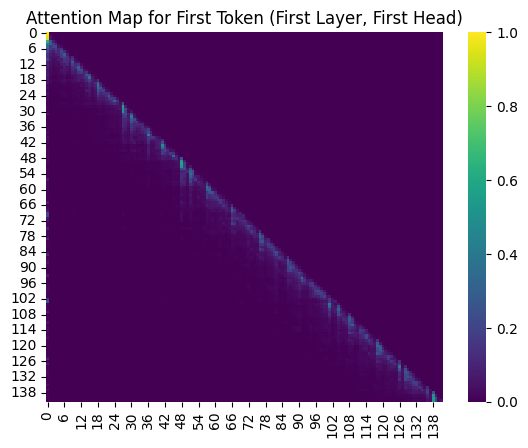

In [ ]:
inputs = tokenizer(
            [
                alpaca_prompt.format(
                    "You are expert in answering whether this patient have diabetes. Please answer in Yes or No.", # instruction
                    "The Age is 50. The Number of times pregnant is 6. The Diastolic blood pressure is 72. The Triceps skin fold thickness is 35. The Plasma glucose concentration at 2 hours in an oral glucose tolerance test (GTT) is 148. The 2-hour serum insulin is 0. The Body mass index is 33.6. The Diabetes pedigree function is 0.627.", # input
                    "", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)

In [ ]:
transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
generated_tokens = outputs.sequences[:, input_length:]

In [ ]:
len(input_ids[0])

144

In [ ]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns

# Tokenize the input
input_ids = tokenizer.encode(
    alpaca_prompt.format(
        "You are an expert in answering whether this patient has diabetes. Please first answer in Yes or No.",
        "The Age is 50. The Number of times pregnant is 6. The Diastolic blood pressure is 72. The Triceps skin fold thickness is 35. The Plasma glucose concentration at 2 hours in an oral glucose tolerance test (GTT) is 148. The 2-hour serum insulin is 0. The Body mass index is 33.6. The Diabetes pedigree function is 0.627.",
        "",
    ),
    return_tensors="pt",  # Use PyTorch tensors
    padding=True
).to("cuda")  # Move inputs to GPU if available



In [ ]:
input_ids

tensor([[128000,  39314,    374,    459,   7754,    430,  16964,    264,   3465,
             11,  35526,    449,    459,   1988,    430,   5825,   4726,   2317,
             13,   9842,    264,   2077,    430,  36001,  45695,    279,   1715,
            382,  14711,  30151,    512,   2675,    527,    459,   6335,    304,
          36864,   3508,    420,   8893,    706,  20335,     13,   5321,   1176,
           4320,    304,   7566,    477,   2360,    382,  14711,   5688,    512,
            791,  13381,    374,    220,   1135,     13,    578,   5742,    315,
           3115,  20895,    374,    220,     21,     13,    578,   7923,    561,
           7918,   6680,   7410,    374,    220,   5332,     13,    578,   1183,
          75669,   6930,  11816,  26839,    374,    220,   1758,     13,    578,
          65632,  34323,  20545,    520,    220,     17,   4207,    304,    459,
          21308,  34323,  25065,   1296,    320,     38,  15249,      8,    374,
            220,  10410,    

In [ ]:
attention_mask = torch.ones_like(input_ids)

In [ ]:
# Variables to store generated tokens and attentions
generated_ids = input_ids.clone()
all_attentions = []

# Set maximum generation length
max_generation_length = 50

# Generate tokens step by step
for i in range(max_generation_length):

    outputs = model(
        input_ids=generated_ids,
        attention_mask=attention_mask,
        output_attentions=True,
        use_cache=True
    )

    # Get the next token logits
    next_token_logits = outputs.logits[:, -1, :]

    # Sample or select the next token (here we use argmax for simplicity)
    next_token_id = torch.argmax(next_token_logits, dim=-1).unsqueeze(-1)

    # Append the next token to the generated sequence
    generated_ids = torch.cat([generated_ids, next_token_id], dim=-1)

    # Update attention mask
    attention_mask = torch.ones_like(generated_ids)

    # Collect attentions
    all_attentions.append(outputs.attentions)
    print(i)
    # Optional: Stop if the model generates the end-of-sequence token
    if next_token_id.item() == tokenizer.eos_token_id:
        break

0
1


In [ ]:
tokenizer.decode(input_ids[0])

'<|begin_of_text|>Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.\n\n### Instruction:\nYou are an expert in answering whether this patient has diabetes. Please first answer in Yes or No.\n\n### Input:\nThe Age is 50. The Number of times pregnant is 6. The Diastolic blood pressure is 72. The Triceps skin fold thickness is 35. The Plasma glucose concentration at 2 hours in an oral glucose tolerance test (GTT) is 148. The 2-hour serum insulin is 0. The Body mass index is 33.6. The Diabetes pedigree function is 0.627.\n\n### Response:\n'

In [ ]:
# Example: Accessing attention from the last generation step
last_step_attentions = all_attentions[-1]  # List of tensors from each layer

# For each layer, the attention tensor shape is (batch_size, num_heads, seq_len, seq_len)
# where seq_len includes both input and generated tokens up to that step


In [ ]:
len(last_step_attentions)

32

In [ ]:
last_step_attentions[0][0].shape

torch.Size([32, 145, 145])

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_attention(attention, layer=0, head=0):
    # attention: list of attention tensors from each generation step
    # Select the attention tensor from the desired layer and head
    attentions = [attn[layer][0][head].detach().cpu().numpy() for attn in attention]

    # Plot the attention matrices over the generation steps
    for step, attn_matrix in enumerate(attentions):
        plt.figure(figsize=(6, 6))
        plt.imshow(attn_matrix, cmap='viridis')
        plt.title(f'Layer {layer}, Head {head}, Step {step}')
        plt.xlabel('Tokens Attended To')
        plt.ylabel('Tokens Attending')
        plt.show()


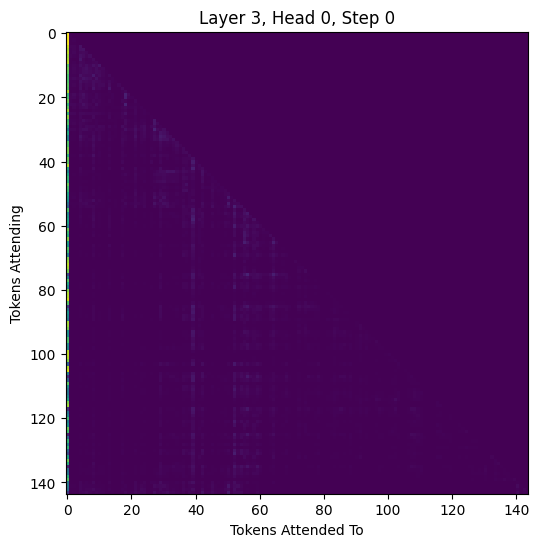

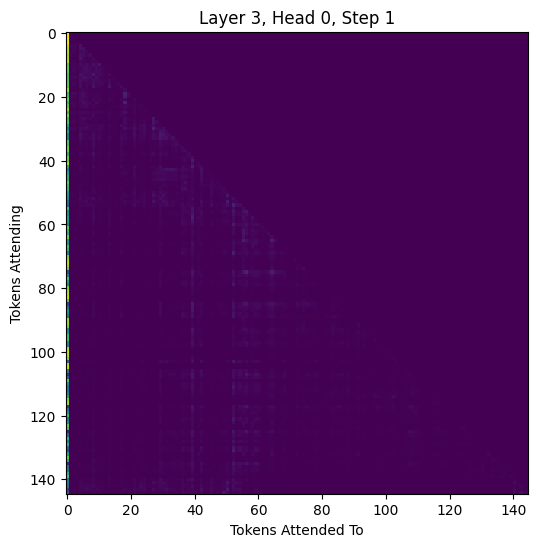

In [ ]:
plot_attention(all_attentions,layer=3)

In [ ]:
target_sentence = "The Age is 50."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Find the location of the target sentence in the full tokenized input
def find_subsequence(full_sequence, subsequence):
    """Helper function to find subsequence within full sequence."""

    for i in range(len(full_sequence) - len(subsequence) + 1):

        if full_sequence[i:i + len(subsequence)] == subsequence:
            return i, i + len(subsequence)
    return None

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

'The Age is 50.' starts at token position 54 and ends at position 59
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
The Number of times pregnant is 6. The Diastolic blood pressure is 72. The Triceps skin fold thickness is 35. The Plasma glucose concentration at 2 hours in an oral glucose tolerance test (GTT) is 148. The 2-hour serum insulin is 0. The Body mass index is 33.6. The Diabetes pedigree function is 0.627.

In [ ]:
target_sentence = " The Number of times pregnant is 6."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The Number of times pregnant is 6.' starts at token position 60 and ends at position 68
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
target_sentence = " The Diastolic blood pressure is 72."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The Diastolic blood pressure is 72.' starts at token position 69 and ends at position 78
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
target_sentence = " The Triceps skin fold thickness is 35."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The Triceps skin fold thickness is 35.' starts at token position 79 and ends at position 88
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
target_sentence = " The Plasma glucose concentration at 2 hours in an oral glucose tolerance test (GTT) is 148."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The Plasma glucose concentration at 2 hours in an oral glucose tolerance test (GTT) is 148.' starts at token position 89 and ends at position 110
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
target_sentence = " The 2-hour serum insulin is 0."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The 2-hour serum insulin is 0.' starts at token position 111 and ends at position 120
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
target_sentence = " The Body mass index is 33.6."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The Body mass index is 33.6.' starts at token position 121 and ends at position 130
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
target_sentence = " The Diabetes pedigree function is 0.627."



# Tokenize the specific part you want to locate
target_tokenized = tokenizer(target_sentence, return_tensors="pt", padding=True)
target_token_ids = target_tokenized['input_ids'][0][1:-1]  # Ignore special tokens (<bos> and <eos>)


target_tokens = tokenizer.convert_ids_to_tokens(target_token_ids)

# Locate the position
start_idx, end_idx = find_subsequence(input_ids.tolist()[0], target_token_ids.tolist())

# Print the location and the corresponding tokens
if start_idx is not None:
    print(f"'{target_sentence}' starts at token position {start_idx} and ends at position {end_idx}")
    print("Tokens:", input_ids[start_idx:end_idx])
else:
    print(f"'{target_sentence}' not found in the tokenized input.")

' The Diabetes pedigree function is 0.627.' starts at token position 131 and ends at position 140
Tokens: tensor([], device='cuda:0', size=(0, 144), dtype=torch.int64)


In [ ]:
last_step_attentions

(tensor([[[[1.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           [9.4775e-01, 5.2429e-02, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           [9.3262e-01, 5.2399e-02, 1.4954e-02,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           ...,
           [1.0712e-02, 3.5107e-05, 1.4603e-05,  ..., 2.5192e-02,
            0.0000e+00, 0.0000e+00],
           [1.8396e-03, 1.3769e-05, 7.3314e-06,  ..., 2.1255e-02,
            5.4504e-02, 0.0000e+00],
           [1.0742e-02, 7.2896e-05, 3.5107e-05,  ..., 4.7943e-02,
            2.6025e-01, 2.2385e-02]],
 
          [[1.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           [9.8730e-01, 1.2909e-02, 0.0000e+00,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           [9.4421e-02, 8.2812e-01, 7.7332e-02,  ..., 0.0000e+00,
            0.0000e+00, 0.0000e+00],
           ...,
           [4.4922e-01, 1.6642e-04, 1.

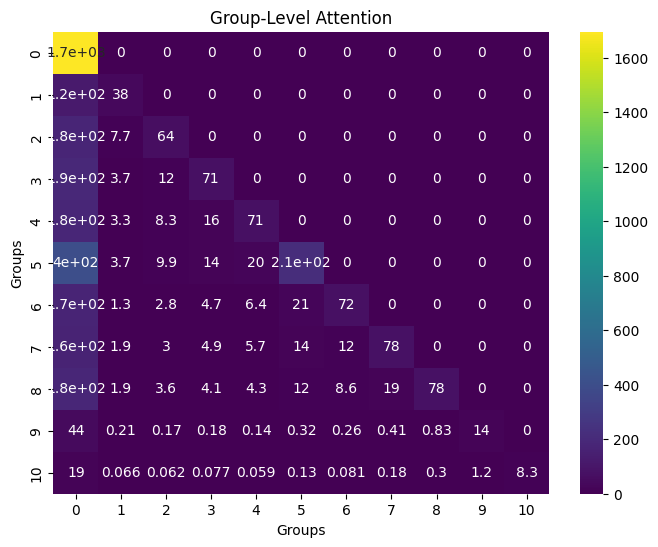

In [ ]:
import numpy as np

def aggregate_attention_by_group(attention_matrix, groups):
    """
    Aggregate token-level attention to group-level attention.

    Parameters:
    - attention_matrix: A 2D numpy array of shape (seq_length, seq_length) for token-level attention.
    - groups: A list of tuples where each tuple contains the (start_idx, end_idx) for a group of tokens.

    Returns:
    - group_attention_matrix: A 2D numpy array of shape (num_groups, num_groups) for group-level attention.
    """
    num_groups = len(groups)
    group_attention_matrix = np.zeros((num_groups, num_groups))

    for i, (start_i, end_i) in enumerate(groups):
        for j, (start_j, end_j) in enumerate(groups):
            # Extract the token-level attention for group i attending to group j
            attention_submatrix = attention_matrix[start_i:end_i, start_j:end_j]

            # Average or sum the attention submatrix to get group-level attention
            group_attention_matrix[i, j] = np.sum(attention_submatrix)  # You can use np.sum() instead if needed

    return group_attention_matrix

# Example token-level attention matrix (this would be extracted from your model)
## the first layer
token_attention_matrix = last_step_attentions[31][0].detach().cpu().numpy()

# Define your groups (start_idx, end_idx for each group)
# For example:
groups = [(0, 53),  #Group of model format
          (54, 59), #Group for "The Age is 50"
          (60,68),  #Group for number of pregant times
          (69,78), #Group for dynamic blood pressure
          (79,88), # Group for skin fold thickness
          (89,110), #Group for plasma glucose
          (111,120), #Group for 2-hour insulin
          (121,130), #Group for bmi
          (130,140), #Group for diabetes pedigree function
          (141,143), #group for format
          (144,145) #group for answer
          # Group for "The Number of times pregnant is 6"
          # Add more groups as needed
         ]
# Sum across the 32 attention heads
# Sum across the 32 attention heads (for NumPy, use axis instead of dim)
sum_attention = token_attention_matrix.sum(axis=0)  # Shape will be [145, 145]
# sum or mean over head

# Average across the 32 attention heads
avg_attention = token_attention_matrix.mean(axis=0)  # Shape will be [145, 145]



# You can visualize or process them as needed

# Convert token-level attention to group-level attention
group_attention_matrix = aggregate_attention_by_group(sum_attention, groups)

# Now you can visualize or use the group-level attention matrix
plt.figure(figsize=(8, 6))
sns.heatmap(group_attention_matrix, cmap="viridis", annot=True)
plt.title("Group-Level Attention")
plt.xlabel("Groups")
plt.ylabel("Groups")
plt.show()



In [ ]:
1. diabetes peigree function 2. bmi 3. glucose 4. insulin 5.dbp 6.age 6. number of pregnant times 7.skin fold

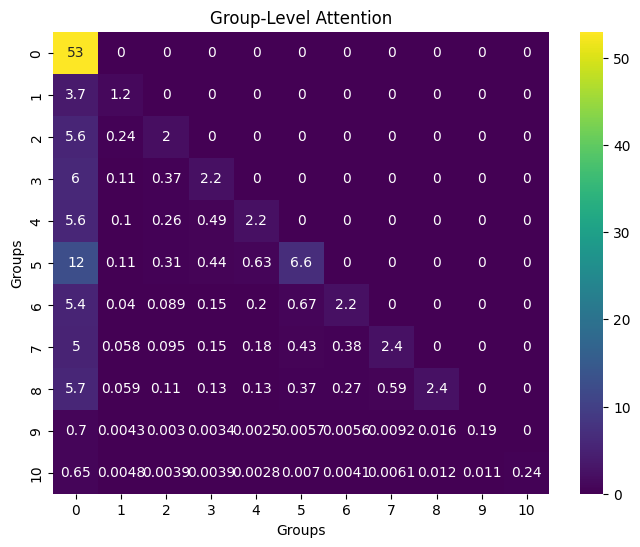

In [ ]:
group_attention_matrix = aggregate_attention_by_group(avg_attention, groups)

# Now you can visualize or use the group-level attention matrix
plt.figure(figsize=(8, 6))
sns.heatmap(group_attention_matrix, cmap="viridis", annot=True)
plt.title("Group-Level Attention")
plt.xlabel("Groups")
plt.ylabel("Groups")
plt.show()


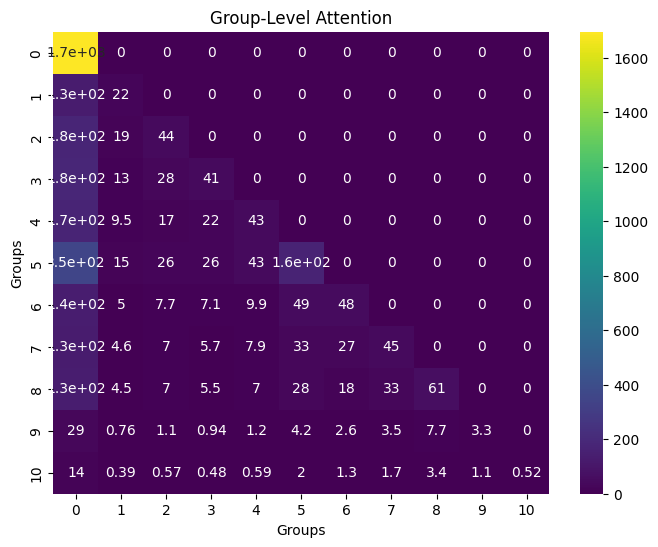

In [ ]:
import numpy as np

def aggregate_attention_by_group(attention_matrix, groups):
    """
    Aggregate token-level attention to group-level attention.

    Parameters:
    - attention_matrix: A 2D numpy array of shape (seq_length, seq_length) for token-level attention.
    - groups: A list of tuples where each tuple contains the (start_idx, end_idx) for a group of tokens.

    Returns:
    - group_attention_matrix: A 2D numpy array of shape (num_groups, num_groups) for group-level attention.
    """
    num_groups = len(groups)
    group_attention_matrix = np.zeros((num_groups, num_groups))

    for i, (start_i, end_i) in enumerate(groups):
        for j, (start_j, end_j) in enumerate(groups):
            # Extract the token-level attention for group i attending to group j
            attention_submatrix = attention_matrix[start_i:end_i, start_j:end_j]

            # Average or sum the attention submatrix to get group-level attention
            group_attention_matrix[i, j] = np.sum(attention_submatrix)  # You can use np.sum() instead if needed

    return group_attention_matrix

# Example token-level attention matrix (this would be extracted from your model)
## the first layer
token_attention_matrix = last_step_attentions[0][0].detach().cpu().numpy()

# Define your groups (start_idx, end_idx for each group)
# For example:
groups = [(0, 53),  #Group of model format
          (54, 59), #Group for "The Age is 50"
          (60,68),  #Group for number of pregant times
          (69,78), #Group for dynamic blood pressure
          (79,88), # Group for skin fold thickness
          (89,110), #Group for plasma glucose
          (111,120), #Group for 2-hour insulin
          (121,130), #Group for bmi
          (130,140), #Group for diabetes pedigree function
          (141,143), #group for format
          (144,145) #group for answer
          # Group for "The Number of times pregnant is 6"
          # Add more groups as needed
         ]
# Sum across the 32 attention heads
# Sum across the 32 attention heads (for NumPy, use axis instead of dim)
sum_attention = token_attention_matrix.sum(axis=0)  # Shape will be [145, 145]
# sum or mean over head

# Average across the 32 attention heads
avg_attention = token_attention_matrix.mean(axis=0)  # Shape will be [145, 145]



# You can visualize or process them as needed

# Convert token-level attention to group-level attention
group_attention_matrix = aggregate_attention_by_group(sum_attention, groups)

# Now you can visualize or use the group-level attention matrix
plt.figure(figsize=(8, 6))
sns.heatmap(group_attention_matrix, cmap="viridis", annot=True)
plt.title("Group-Level Attention")
plt.xlabel("Groups")
plt.ylabel("Groups")
plt.show()



In [ ]:
1. diabetes peigree function 2. glucose 3. bmi 4. 2-hour insulin 5. dbp 6. skin fold 7. number of pregnant times 8.age

32

In [ ]:
tokenizer.decode([128000,  39314,    374,    459,   7754,    430,  16964,    264,   3465,
             11,  35526,    449,    459,   1988,    430,   5825,   4726,   2317,
             13,   9842,    264,   2077,    430,  36001,  45695,    279,   1715,
            382,  14711,  30151,    512,   2675,    527,    459,   6335,    304,
          36864,   3508,    420,   8893,    706,  20335,     13,   5321,   1176,
           4320,    304,7566,    477,   2360,    382,  14711,   5688,512,])

'<|begin_of_text|>Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.\n\n### Instruction:\nYou are an expert in answering whether this patient has diabetes. Please first answer in Yes or No.\n\n### Input:\n'

In [ ]:
output_tokens

['Yes',
 'ĊĊ',
 'Reason',
 's',
 ':Ċ',
 '1',
 '.',
 'ĠThe',
 'ĠPlasma',
 'Ġglucose',
 'Ġconcentration',
 'Ġat',
 'Ġ',
 '2',
 'Ġhours',
 'Ġin',
 'Ġan',
 'Ġoral',
 'Ġglucose',
 'Ġtolerance',
 'Ġtest',
 'Ġ(',
 'G',
 'TT',
 ')',
 'Ġis',
 'Ġ',
 '148',
 ',',
 'Ġwhich',
 'Ġis',
 'Ġhigher',
 'Ġthan',
 'Ġthe',
 'Ġnormal',
 'Ġvalue',
 ',',
 'Ġindicating',
 'Ġa',
 'Ġpotential',
 'Ġissue',
 'Ġwith',
 'Ġblood',
 'Ġsugar',
 'Ġregulation',
 '.Ċ',
 '2',
 '.',
 'ĠThe',
 'ĠBody',
 'Ġmass',
 'Ġindex',
 'Ġis',
 'Ġ',
 '33',
 '.',
 '6',
 ',',
 'Ġwhich',
 'Ġfalls',
 'Ġinto',
 'Ġthe',
 'Ġobese',
 'Ġcategory',
 ',',
 'Ġincreasing',
 'Ġthe',
 'Ġrisk',
 'Ġfor',
 'Ġdiabetes',
 '.Ċ',
 '3',
 '.',
 'ĠThe',
 'Ġpatient',
 'Ġhas',
 'Ġbeen',
 'Ġpregnant',
 'Ġsix',
 'Ġtimes',
 ',',
 'Ġwhich',
 'Ġmay',
 'Ġindicate',
 'Ġinsulin',
 'Ġresistance',
 'Ġor',
 'Ġother',
 'Ġfactors',
 'Ġcontributing',
 'Ġto',
 'Ġdiabetes',
 '.',
 'ĠĊ',
 '4',
 '.',
 'ĠThe',
 'Ġ',
 '2',
 '-hour',
 'Ġserum',
 'Ġinsulin',
 'Ġis',
 'Ġ',
 '0',
 ',',
 '

In [ ]:
input_tokens

['<|begin_of_text|>',
 'Below',
 'Ġis',
 'Ġan',
 'Ġinstruction',
 'Ġthat',
 'Ġdescribes',
 'Ġa',
 'Ġtask',
 ',',
 'Ġpaired',
 'Ġwith',
 'Ġan',
 'Ġinput',
 'Ġthat',
 'Ġprovides',
 'Ġfurther',
 'Ġcontext',
 '.',
 'ĠWrite',
 'Ġa',
 'Ġresponse',
 'Ġthat',
 'Ġappropriately',
 'Ġcompletes',
 'Ġthe',
 'Ġrequest',
 '.ĊĊ',
 '###',
 'ĠInstruction',
 ':Ċ',
 'You',
 'Ġare',
 'Ġan',
 'Ġexpert',
 'Ġin',
 'Ġanswering',
 'Ġwhether',
 'Ġthis',
 'Ġpatient',
 'Ġhas',
 'Ġdiabetes',
 '.',
 'ĠPlease',
 'Ġanswer',
 'Ġin',
 'ĠYes',
 'Ġor',
 'ĠNo',
 '.ĊĊ',
 '###',
 'ĠInput',
 ':Ċ',
 'The',
 'ĠAge',
 'Ġis',
 'Ġ',
 '50',
 '.',
 'ĠThe',
 'ĠNumber',
 'Ġof',
 'Ġtimes',
 'Ġpregnant',
 'Ġis',
 'Ġ',
 '6',
 '.',
 'ĠThe',
 'ĠDi',
 'ast',
 'olic',
 'Ġblood',
 'Ġpressure',
 'Ġis',
 'Ġ',
 '72',
 '.',
 'ĠThe',
 'ĠTr',
 'iceps',
 'Ġskin',
 'Ġfold',
 'Ġthickness',
 'Ġis',
 'Ġ',
 '35',
 '.',
 'ĠThe',
 'ĠPlasma',
 'Ġglucose',
 'Ġconcentration',
 'Ġat',
 'Ġ',
 '2',
 'Ġhours',
 'Ġin',
 'Ġan',
 'Ġoral',
 'Ġglucose',
 'Ġtolerance',

In [ ]:
generated_tokens = outputs.sequences[:, input_length:]
indices = (generated_tokens.cpu()[0] == 93813).nonzero(as_tuple=False)
if len(indices) > 0:
    # Get the first occurrence
    first_occurrence = indices[0]
    row= first_occurrence.item()

    # Get all values before the location of 8
    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()

    # Decode the tokens
    decoded_text = tokenizer.decode(values_before_8)

In [ ]:
import re

def extract_values(text):
    # Define the pattern for each segment
    abeta_status_pattern = r"is in ([^ ]+ [^ ]+|Unknown) abeta accumulation status"
    abeta_rate_pattern = r"and has a ([^ ]+) accumulation rate"
    ec_tau_pattern = r"In EC ROIs, this patient has ([^ ]+ [^ ]+|Unknown) tau accumulation"
    ec_increase_pattern = r"and is ([^ ]+) to experience further increase"
    meta_tau_pattern = r"In meta ROIs, this patient has ([^ ]+ [^ ]+|Unknown) tau accumulation"
    meta_increase_pattern = r"and is ([^ ]+) to experience further increase"
    mmse_rate_pattern = r"The MMSE score is expected to decrease at a ([^ ]+) rate"

    # Helper function to safely extract groups
    def safe_extract(pattern, text):
        match = re.search(pattern, text)
        return match.group(1) if match else "Not found"

    # Extract values using the helper function
    abeta_status = safe_extract(abeta_status_pattern, text)
    abeta_rate = safe_extract(abeta_rate_pattern, text)
    ec_tau = safe_extract(ec_tau_pattern, text)
    ec_increase = safe_extract(ec_increase_pattern, text)
    meta_tau = safe_extract(meta_tau_pattern, text)
    meta_increase = safe_extract(meta_increase_pattern, text)
    mmse_rate = safe_extract(mmse_rate_pattern, text)

    # Store the extracted values in a dictionary
    extracted_values = {
        "Abeta accumulation status": abeta_status,
        "Abeta accumulation rate": abeta_rate,
        "EC ROIs tau accumulation": ec_tau,
        "EC ROIs future tau increase likelihood": ec_increase,
        "Meta ROIs tau accumulation": meta_tau,
        "Meta ROIs future tau increase likelihood": meta_increase,
        "MMSE score decrease rate": mmse_rate
    }

    return extracted_values

# Example usage
generated_answer = "This patient is in Clearly positive abeta accumulation status and has a Unknown accumulation rate. In EC ROIs, this patient has Super high tau accumulation and is Unknown to experience further increase. In meta ROIs, this patient has Super high tau accumulation and is Unknown to experience further increase. The MMSE score is expected to decrease at a Unknown rate"

extracted_values = extract_values(generated_answer)
for key, value in extracted_values.items():
    print(f"{key}: {value}")


Abeta accumulation status: Clearly positive
Abeta accumulation rate: Unknown
EC ROIs tau accumulation: Super high
EC ROIs future tau increase likelihood: Unknown
Meta ROIs tau accumulation: Super high
Meta ROIs future tau increase likelihood: Unknown
MMSE score decrease rate: Unknown


In [ ]:
extracted_values["Abeta accumulation status"]=="Unknown"

False

In [ ]:
tokenizer.decode(generated_tokens[0])

'This patient is in Clearly positive abeta accumulation status and has a Unknown accumulation rate. In EC ROIs, this patient has Unknown tau accumulation and is Unknown to experience further increase. In meta ROIs, this patient has Unknown tau accumulation and is Unknown to experience further increase. The MMSE score is expected to decrease at a Unknown rate.<|eot_id|>'

In [ ]:
generated_tokens.cpu()[0][indices]

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [ ]:
i=1
input= "Patient Baseline information:\n Demographic information:\n  This patient is Retired, Male,  and the marital status is Married,  with 12 years of education, a self-identified race Black or African American, ethnicity Not Hispanic or Latino.   Patient the most current visit: Vital Signs and Measurements: \n Age: 64.0\n\n  Cognitive test scores:\n Geriatric Depression Scale: 10,  American National Adult Reading Test Total Errors: 12, Clinical Dementia Rating Scale Sum of Boxes Scores: 0, Mini-mental state examination: 28,  Delayed Total Recall test: 8, Digit Subsitution test: 35 \n\n Blood or Cerebrospinal fluid test (different from the output scale):\n Beta-amyloid load z-score: 0.769, phosphorylated-tau protein load z-score: -0.808, tau protein load z-score: -0.845. \n\n MRI Brain Scan Volume:\n,  Hippocampus: 9137,  Total intracranial: 1465737. \n\n MRI Brain Scan Thickness:\n Entorhinal: 6.119,  Fusiform: 5.487,  Inferior Parietal: 4.852,  Inferior Temporal: 5.471,  Middle Temporal: 5.569,  Precuneus: 4.762,  Insula: 5.761,  metaROI: 5.43 . \n\n Overall diagnosis:\n  The overall diagnosis status for the patient is cognitively normal, No depression."
inputs = tokenizer(
            [
                alpaca_prompt.format(
                   instruction_llm, # instruction
                  input, # input
                    "Abeta: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        #
outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
generated_tokens = outputs.sequences[:, input_length:]
calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta")
indices = (generated_tokens.cpu()[0] == tokenizer("Abeta")["input_ids"][1]).nonzero(as_tuple=False)
if len(indices)==0:
    indices = (generated_tokens.cpu()[0] == tokenizer(" Abeta")["input_ids"][1]).nonzero(as_tuple=False)
if len(indices)==0:
    indices = (generated_tokens.cpu()[0] == tokenizer(".Abeta")["input_ids"][1]).nonzero(as_tuple=False)
if len(indices) > 0:
    first_occurrence = indices[0]
    row= first_occurrence.item()
    values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
    decoded_text = tokenizer.decode(values_before_8)

    inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    input, # input
                    "Abeta: This"+decoded_text+"Abeta rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
    outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
    transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
    input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
    generated_tokens = outputs.sequences[:, input_length:]
    calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_abeta_rate")
    indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
    if len(indices)==0:
        indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
    if len(indices)==0:
        indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
    if len(indices) > 0:
        first_occurrence = indices[0]
        row= first_occurrence.item()
        values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
        decoded_text_abeta_rate = tokenizer.decode(values_before_8)

        inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    input, # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
        outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
        transition_scores = model.compute_transition_scores(
                    outputs.sequences, outputs.scores, normalize_logits=True
                    )
        input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
        generated_tokens = outputs.sequences[:, input_length:]
        calculate_probability_new(outputs,generated_tokens, i,"mmse_unknown_ec_tau")
        indices = (generated_tokens.cpu()[0] == tokenizer("EC")["input_ids"][1]).nonzero(as_tuple=False)
        if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(" EC")["input_ids"][1]).nonzero(as_tuple=False)
        if len(indices)==0:
              indices = (generated_tokens.cpu()[0] == tokenizer(".E")["input_ids"][1]).nonzero(as_tuple=False)
        if len(indices) > 0:
              first_occurrence = indices[0]
              row= first_occurrence.item()
              values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
              decoded_text_ec_tau = tokenizer.decode(values_before_8)
              inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    input, # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
              outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
              transition_scores = model.compute_transition_scores(
              outputs.sequences, outputs.scores, normalize_logits=True
                    )
              input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
              generated_tokens = outputs.sequences[:, input_length:]

              calculate_probability_new(outputs,generated_tokens,i,"mmse_unknown_ec_tau_rate")
              indices = (generated_tokens.cpu()[0] == tokenizer("Meta")["input_ids"][1]).nonzero(as_tuple=False)
              if len(indices)==0:
                 indices = (generated_tokens.cpu()[0] == tokenizer(" Meta")["input_ids"][1]).nonzero(as_tuple=False)
              if len(indices)==0:
                  indices = (generated_tokens.cpu()[0] == tokenizer(".M")["input_ids"][1]).nonzero(as_tuple=False)
              if len(indices) > 0:
                  first_occurrence = indices[0]
                  row= first_occurrence.item()
                  values_before_8 = generated_tokens.cpu()[0][0:(row)].tolist()
                  decoded_text_ec_tau_all = tokenizer.decode(values_before_8)
                  inputs = tokenizer(
            [
                alpaca_prompt.format(
                    instruction_llm, # instruction
                    input, # input
                    "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The"+decoded_text_ec_tau_all+"Meta tau: This", # output - leave this blank for generation!
                    )
                ], return_tensors = "pt").to("cuda")
                  outputs =model.generate(**inputs, max_new_tokens = 512, use_cache = True,output_scores=True, return_dict_in_generate=True)
                  transition_scores = model.compute_transition_scores(
              outputs.sequences, outputs.scores, normalize_logits=True
                    )
                  input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
                  generated_tokens = outputs.sequences[:, input_length:]
                  entry = {
                "instruction":  instruction_llm,
                "input":input,
                "output": "Abeta: This"+decoded_text+"Abeta rate: The"+decoded_text_abeta_rate+"EC tau: This"+decoded_text_ec_tau+"EC tau rate: The"+decoded_text_ec_tau_all+"Meta tau: This"+tokenizer.decode(generated_tokens.cpu()[0]),
                "index":i
                }
                  calculate_probability_new(outputs,generated_tokens,i,"mmse_unknown_meta_tau")

{'ĠNegative': [(2, 0.16958898305892944), (3, 0.8545611500740051)], 'ĠIntermediate': [(3, 0.14543887972831726)], 'ĠWeak': [], 'ĠClearly': [], 'ĠUnknown': [], 'ĠSlow': [(17, 0.8267117738723755), (83, 0.7335270047187805)], 'ĠModerate': [(83, 0.09133484214544296)], 'ĠFast': [], 'ĠZero': [(17, 0.17328819632530212), (83, 0.1751381903886795)], 'ĠVery': [(26, 0.7905303239822388), (52, 1.0)], 'ĠLow': [(26, 0.20946969091892242)], 'ĠHigh': [], 'ĠSuper': [], 'ĠPossibly': [(39, 0.30846768617630005)], 'ĠUn': [(39, 0.6915323138237), (65, 1.0)], 'Ġlikely': [], 'ĠPoss': [], 'Ġibly': []}
{'ĠNegative': [], 'ĠIntermediate': [], 'ĠWeak': [], 'ĠClearly': [], 'ĠUnknown': [], 'ĠSlow': [(5, 0.8229490518569946), (71, 0.7383106350898743)], 'ĠModerate': [(71, 0.09435570240020752)], 'ĠFast': [], 'ĠZero': [(5, 0.1770508885383606), (71, 0.16733364760875702)], 'ĠVery': [(14, 0.7772998809814453), (40, 1.0)], 'ĠLow': [(14, 0.22270014882087708)], 'ĠHigh': [], 'ĠSuper': [], 'ĠPossibly': [(27, 0.3029409945011139)], 'ĠUn':

In [ ]:
import torch
import torch.nn.functional as F
logits = outputs.scores[65]
top_k = 10 # Set the number of top tokens you want to see
top_k_values, top_k_indices = torch.topk(logits, top_k)



probs = F.softmax(logits, dim=-1)

# Get the top-k probabilities
top_k_probs = probs[0, top_k_indices[0]]

# Convert token indices to words
top_k_tokens = [tokenizer.decode(indices) for indices in top_k_indices[0]]

print("Top-k tokens with probabilities:")
for token, prob in zip(top_k_tokens, top_k_probs):
    print(f"Token: {token}, Probability: {prob.item()}")

Top-k tokens with probabilities:
Token:  Unknown, Probability: 0.903748095035553
Token:  Fast, Probability: 0.09625189006328583
Token: !, Probability: 0.0
Token: ", Probability: 0.0
Token: ', Probability: 0.0
Token: (, Probability: 0.0
Token: &, Probability: 0.0
Token: %, Probability: 0.0
Token: #, Probability: 0.0
Token: $, Probability: 0.0


In [ ]:
import pandas as pd
final=pd.DataFrame({"decrease":decrease_prob})
final2=pd.DataFrame({"not":not_prob})


In [ ]:
final.to_csv("/content/drive/MyDrive/LLaMA-Factory/data/decrease_prob.csv")

In [ ]:
final2.to_csv("/content/drive/MyDrive/LLaMA-Factory/data/no_prob.csv")

In [ ]:
next_token = tokenizer.encode(next_token_str, return_tensors='pt')

In [ ]:
input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
generated_tokens = outputs.sequences[:, input_length:]
(tokenizer.decode(generated_tokens.cpu()[0]))

'Abeta: Unknown.\nTau: Unknown.\nMMSE: The predicted MMSE score is 30.0. The patient is in normal cognition. The score is predicted to decrease by 0.87 per year.<|eot_id|>'

In [ ]:
def sample_from_logits(logits, temperature=1.0, top_k=5):
    # Apply temperature to the logits
    logits = logits / temperature

    # Apply top-k sampling
    top_k_logits, top_k_indices = torch.topk(logits, top_k)
    top_k_probs = F.softmax(top_k_logits, dim=-1)
    next_token = torch.multinomial(top_k_probs, 1)

    return top_k_indices[next_token]

In [ ]:
top_k_logits, top_k_indices = torch.topk(logits, top_k)
top_k_probs = F.softmax(top_k_logits, dim=-1)
next_token = torch.multinomial(top_k_probs, 1)

In [ ]:
top_k_indices[1]

IndexError: index 1 is out of bounds for dimension 0 with size 1

In [ ]:
# Extract logits and generated tokens
logits = outputs.scores[0]
input_length = 1 if model.config.is_encoder_decoder else inputs.input_ids.shape[1]
generated_tokens = outputs.sequences[:, input_length:]

    # Decode the generated tokens
generated_text = tokenizer.decode(generated_tokens.cpu()[0])

    # Generate new sentence by sampling
new_generated_tokens = generated_tokens.clone()
for _ in range(50):  # Generate up to 50 new tokens
  next_token = sample_from_logits(logits[0])
  new_generated_tokens = torch.cat((new_generated_tokens, next_token))
  logits = model(new_generated_tokens).logits[:, -1, :]

new_generated_text = tokenizer.decode(new_generated_tokens.cpu()[0])

RuntimeError: Tensors must have same number of dimensions: got 2 and 1

In [ ]:
new_generated_tokens

tensor([[  5953,   1955,     25,  22435,    627,  93813,     25,  22435,    627,
           8195,    937,     25,    578,  19698,  22403,    937,   5573,    374,
            220,    966,     13,     15,     13,    578,   8893,    374,    304,
           4725,  75310,     13,    578,   5573,    374,  19698,    311,  18979,
            555,    220,     15,     13,   4044,    824,   1060,     13, 128009]],
       device='cuda:0')

In [ ]:
next_token

tensor([5953], device='cuda:0')

In [ ]:
logits[0]

tensor([3.8672, 9.7812, 6.1406,  ..., 0.7773, 0.7773, 0.7773], device='cuda:0')

In [ ]:
outputs =model.generate(**inputs, max_new_tokens=512)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


In [ ]:
tokenizer.decode(generated_tokens.cpu()[0])

'Abeta: Unknown.\nTau: Unknown.\nMMSE: The predicted MMSE score is 29.0. The patient is in normal cognition. The score is predicted to decrease by 0.82 per year.<|eot_id|>'

In [ ]:
probability

NameError: name 'probability' is not defined

In [ ]:
probability

[tensor(0.9429, device='cuda:0', dtype=torch.float16),
 tensor(0.9453, device='cuda:0', dtype=torch.float16),
 tensor(0.9370, device='cuda:0', dtype=torch.float16),
 tensor(0.9429, device='cuda:0', dtype=torch.float16)]

In [ ]:
outputs=model(**inputs)
logits=outputs.get("logits")


In [ ]:
logits[-1][1]

tensor(-0.8999, device='cuda:0', dtype=torch.float16)

In [ ]:
import torch
import torch.nn as nn

# Define the CrossEntropyLoss function
loss_fct = nn.CrossEntropyLoss()

# Example model outputs (logits) and target labels
logits = torch.tensor([[0.5, 1.5, 2.5], [1.0, 2.0, 0.1]], requires_grad=True)
target = torch.tensor([2, 1])

# Calculate the loss
loss = loss_fct(logits, target)

# Print the loss
print(f"Loss: {loss.item()}")


Loss: 0.4123179316520691


In [ ]:
logits.view(-1,2)

tensor([[3.2539, 3.9824],
        [6.6914, 2.6113],
        [2.0098, 0.0177],
        ...,
        [5.2070, 5.2070],
        [5.2070, 5.2070],
        [5.2070, 5.2070]], device='cuda:0')

In [ ]:
true_label=[]
with open('/content/drive/MyDrive/LLaMA-Factory/data/ad_test_data_serialization.json', 'rb') as f:
    json_data = bigjson.load(f)
    for data in json_data:
        dict_data = data.to_python()
        if dict_data['completion']=='No':
            true_label.append(0)
        else:
            true_label.append(1)

In [ ]:
prob_pos=[]
for i in range(len(answer)):
  if answer[i]=="Yes":
    prob_pos.append(probability[i])
    print("yes")
  else:
    prob_pos.append(1-probability[i])


yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


In [ ]:
answer

['No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',
 'No',

In [ ]:
from sklearn.metrics import roc_auc_score

# y_true是真实标签列表，y_scores是预测为正类的概率列表
y_true = true_label
y_scores = prob_pos

auc = roc_auc_score(y_true, y_scores)
print("AUC:", auc)

AUC: 0.782001836547291


In [ ]:
import pandas as pd

# Example lists


# Create a DataFrame
df = pd.DataFrame({
    'true': y_true,
    'pos_prob': y_scores
})

In [ ]:
df.to_csv("/content/drive/MyDrive/ad_predict_test-300.csv")

In [ ]:
logits = model(**inputs).logits


In [ ]:
logits = logits[-1, -1]
import torch
# softmax() to get probabilities
probs = torch.nn.functional.softmax(logits, dim=-1)

# keep only the top 20
probs, ids = torch.topk(probs, 20)

# convert ids to tokens
texts = tokenizer.convert_ids_to_tokens(ids)


In [ ]:
probs

tensor([7.1528e-01, 2.8452e-01, 3.5113e-05, 1.9391e-05, 1.7382e-05, 9.5992e-06,
        7.0230e-06, 6.7014e-06, 5.3847e-06, 3.8483e-06, 3.6151e-06, 3.5591e-06,
        3.1655e-06, 3.1655e-06, 2.5836e-06, 2.4653e-06, 2.4461e-06, 2.1927e-06,
        2.0438e-06, 1.5793e-06], device='cuda:0')

In [ ]:
ids

tensor([ 2822,  9642,  3923,  9173,  2688,  5618,   791, 14331,    56,    45,
         2575,   644,  8586,  9891,  2675, 22105,  7184,  4155,  2028, 24220],
       device='cuda:0')

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# Load tokenizer and model
tokenizer = AutoTokenizer.from_pretrained('/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-20-llama-directzy')
model = AutoModelForSequenceClassification.from_pretrained('/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-20-llama-directzy')

# Combined instruction and table in textual format
prompt = """Given the table below, predict the AMYLOID_STATUS from other factors. Options: [Yes or No].
Input Table(s):
| PTGENDER | PTEDUCAT | ... | Age |
| --- | --- | --- | --- |
| Female | 18 | ... | 87.956 |"""

# Tokenize the prompt
inputs = tokenizer(prompt, return_tensors="pt", truncation=True, padding=True)

# Put model in evaluation mode
model.eval()

# Disable gradient calculation
with torch.no_grad():
    outputs = model(**inputs)

# Get the predicted index
predicted_index = torch.argmax(outputs.logits, dim=-1)

# Convert the index to a response
response = "Yes" if predicted_index.item() == 1 else "No"
print(f"Predicted AMYLOID_STATUS: {response}")


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


OSError: /content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-20-llama-directzy does not appear to have a file named config.json. Checkout 'https://huggingface.co//content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-20-llama-directzy/tree/None' for available files.

In [ ]:
# make sure you connect to a GPU runtime, and connect to your google drive
# Use a A100 GPU for faster training, estimated vRAM usage is 30~35GB
# this script will install the LLaMA-Factory in your google drive, customize the path if you want to install it in a different location
# it will also install the required packages
#!git clone https://github.com/hiyouga/LLaMA-Factory.git "/content/drive/MyDrive/LLaMA-Factory-Jul-31"
%cd "/content/drive/MyDrive/LLaMA-Factory"
%ls
!pip install .

/content/drive/MyDrive/LLaMA-Factory
assets/       config/             evaluation/  merge_llama3.json  requirements.txt  src/
build/        data/               examples/    pyproject.toml     saves/            tests/
cache/        docker-compose.yml  LICENSE      README.md          scripts/
CITATION.cff  Dockerfile          Makefile     README_zh.md       setup.py
Processing /content/drive/MyDrive/LLaMA-Factory
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━

Check

In [ ]:
!pip install rouge-chinese

# for evaluation, llama-factory uses the ROUGE metric, though it is not necessary to our task

In [ ]:
#!pip install gradio --upgrade
# sometimes gradio will not work properly (depends on google colab), you can try to restart the runtime and run the script again

In [ ]:
#!pip install --force-reinstall bitsandbytes


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.1/779.1 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 65.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 103.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 90.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.3/133.3 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 25.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 

In [ ]:
!pip install --force-reinstall accelerate
# if you want to use Q-lora, can reinstall it by the above command, sometimes there are environment issues

In [ ]:
!pip install bitsandbytes -i https://pypi.org/simple

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 MB 33.2 MB/s eta 0:00:00


In [ ]:
!pip show accelerate bitsandbytes

# check the installation, they are required for Q-lora


Name: accelerate
Version: 0.31.0
Summary: Accelerate
Home-page: https://github.com/huggingface/accelerate
Author: The HuggingFace team
Author-email: zach.mueller@huggingface.co
License: Apache
Location: /usr/local/lib/python3.10/dist-packages
Requires: huggingface-hub, numpy, packaging, psutil, pyyaml, safetensors, torch
Required-by: llamafactory, peft, trl
---
Name: bitsandbytes
Version: 0.43.1
Summary: k-bit optimizers and matrix multiplication routines.
Home-page: https://github.com/TimDettmers/bitsandbytes
Author: Tim Dettmers
Author-email: dettmers@cs.washington.edu
License: MIT
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, torch
Required-by: 


In [ ]:
!nvcc --version
# check cuda version, make sure it is 11.0 or higher

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


### Check GPU environment

In [ ]:
import torch
try:
  assert torch.cuda.is_available() is True
except AssertionError:
  print("Please set up a GPU before using LLaMA Factory: https://medium.com/mlearning-ai/training-yolov4-on-google-colab-316f8fff99c6")

### Log in with Hugging Face account to upload model (necessary)

In [ ]:
!huggingface-cli login
# login to huggingface, you need to have an account and API key


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) n
Token is valid (permission: read).
The token `Colab` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/.cache/huggingface/token
Login successful.
The current active token is: `Colab`


In [ ]:
!pip install "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"
!pip3 install -U xformers --index-url https://download.pytorch.org/whl/cu118
!pip install .[torch,bitsandbytes]

  Cloning https://github.com/unslothai/unsloth.git to /tmp/pip-install-yc2b6lw7/unsloth_77c726848ae5481ca8cd8ba41144a7b8
  Running command git clone --filter=blob:none --quiet https://github.com/unslothai/unsloth.git /tmp/pip-install-yc2b6lw7/unsloth_77c726848ae5481ca8cd8ba41144a7b8
  Resolved https://github.com/unslothai/unsloth.git to commit b0781339f035c72b3028d846eb2261e8115cd375
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.9/222.9 MB 6.0 MB/s eta 0:00:00
  Attempting uninstall: xformers
    Found existing installation: xformers 0.0.20
    Uninstalling xformers-0.0.20:
      Successfully uninstalled xformers-0.0.20
Processing /content/drive/MyDrive/LLaMA-Factory
  Installing build dependencies ... done
  Getting requirements to build wheel ... 

In [ ]:
# from unsloth import FastLanguageModel
# max_seq_length = 2048 # Choose any! We auto support RoPE Scaling internally!
# dtype = None # None for auto detection. Float16 for Tesla T4, V100, Bfloat16 for Ampere+
# load_in_4bit = True
# model, tokenizer = FastLanguageModel.from_pretrained(
#         model_name = "/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-20-zy-direct", # YOUR MODEL YOU USED FOR TRAINING
#         max_seq_length = max_seq_length,
#         dtype = dtype,
#         load_in_4bit = load_in_4bit,
#     )
# FastLanguageModel.for_inference(model) # Enable native 2x faster inference



In [ ]:
# alpaca_prompt = """Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.

# ### Instruction:
# {}

# ### Input:
# {}

# ### Response:
# {}"""

# inputs = tokenizer(
# [
#     alpaca_prompt.format(
#         "Given the table below, predict the outcome from other factors. Options: [Yes or No].", # instruction
#         "Input Table(s):| id | V1 | V2 | V3 | V4 | V5 | V6 | V7 | V8 | V9 | V10 |\n| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |\n| 1 | -1 | 1 | -1 | 1 | -1 | -1 | -1 | 1 | -1 | -1 |", # input
#         "", # output - leave this blank for generation!
#     )
# ], return_tensors = "pt").to("cuda")

# outputs = model.generate(**inputs, max_new_tokens = 64, use_cache = True)
# tokenizer.batch_decode(outputs)

In [ ]:
# outputs

In [ ]:
#!pip show llmtuner

## Fine-tune model via LLaMA Board

In [ ]:
#import numpy as np
#from llmtuner import create_ui

#create_ui().queue().launch(share=True,debug=True)
# the UI will be launched, you can use it to fine-tune the model, the model will be saved in the google drive
# make sure you customize everything properly
# need to update dataset_info.json for correct loading of the dataset.

In [ ]:

%pip install --upgrade transformers

In [ ]:
%cd /content/drive/MyDrive/LLaMA-Factory
!GRADIO_SHARE=1 llamafactory-cli webui

/content/drive/MyDrive/LLaMA-Factory
2024-12-27 02:55:35.652249: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-27 02:55:35.670282: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-27 02:55:35.691630: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-27 02:55:35.697971: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-27 02:55:35.713770: I tens

In [ ]:
# Define the different dataset variations you want to train on
# datasets = ['new_order_diabetes_0']

# # Loop over each dataset and run the command
# for dataset in datasets:
!CUDA_VISIBLE_DEVICES=0 llamafactory-cli train \
    --stage sft \
    --do_train True \
    --model_name_or_path unsloth/Meta-Llama-3.1-8B-Instruct-bnb-4bit \
    --preprocessing_num_workers 16 \
    --finetuning_type lora \
    --template default \
    --flash_attn auto \
    --dataset_dir data \
    --dataset "ad_training_Dec27" \
    --cutoff_len 60000\
    --learning_rate 0.0001 \
    --num_train_epochs 1 \
    --max_samples 100000 \
    --per_device_train_batch_size 2 \
    --gradient_accumulation_steps 8 \
    --lr_scheduler_type cosine \
    --max_grad_norm 1.0 \
    --logging_steps 5 \
    --save_steps 1 \
    --warmup_steps 0 \
    --optim adamw_torch \
    --packing False \
    --report_to none \
    --output_dir saves/LLaMA3-8B/lora/train_2025-AD_Jan_3_zero \
    --fp16 True \
    --plot_loss True \
    --lora_rank 8 \
    --lora_alpha 16 \
    --lora_dropout 0 \
    --val_size 0.1 \
    --evaluation_strategy steps \
    --eval_steps 1 \
    --per_device_eval_batch_size 2 \
    --load_best_model_at_end True


2025-01-03 10:46:48.258804: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-03 10:46:48.276267: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-03 10:46:48.297059: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-03 10:46:48.303362: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-03 10:46:48.318909: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
!CUDA_VISIBLE_DEVICES=0 llamafactory-cli train \
    --adapter_name_or_path /content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/checkpoint-500 \
    --stage sft \
    --do_train True \
    --model_name_or_path unsloth/llama-3-8b-Instruct-bnb-4bit \
    --preprocessing_num_workers 16 \
    --finetuning_type lora \
    --template default \
    --flash_attn auto \
    --dataset_dir data \
    --dataset ad_multi_visit_Aug_11_5times_whole \
    --cutoff_len 10000 \
    --learning_rate 5e-05 \
    --num_train_epochs 1.24 \
    --max_samples 100000 \
    --per_device_train_batch_size 2 \
    --gradient_accumulation_steps 8 \
    --lr_scheduler_type cosine \
    --max_grad_norm 1.0 \
    --logging_steps 5 \
    --save_steps 100 \
    --warmup_steps 0 \
    --optim adamw_torch \
    --packing False \
    --report_to none \
    --output_dir saves/LLaMA3-8B/lora/train_2024-08-11-5-new2 \
    --fp16 True \
    --plot_loss True \
    --lora_rank 8 \
    --lora_alpha 16 \
    --lora_dropout 0 \
    --lora_target q_proj,v_proj \
    --val_size 0.2 \
    --evaluation_strategy steps \
    --eval_steps 100 \
    --per_device_eval_batch_size 2 \
    --load_best_model_at_end True


2024-08-11 19:35:49.623163: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-11 19:35:49.641246: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-11 19:35:49.662740: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-11 19:35:49.669275: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-11 19:35:49.684739: I tensorflow/core/platform/cpu_feature_guar

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"
!pip3 install -U xformers --index-url https://download.pytorch.org/whl/cu121
!pip install .[torch,bitsandbytes]

## Fine-tune model via Command Line

In [ ]:
from llamafactory.chat import ChatModel
from llamafactory.extras.misc import torch_gc

%cd /content/LLaMA-Factory/

args = dict(
  model_name_or_path="unsloth/llama-3-8b-Instruct-bnb-4bit", # use bnb-4bit-quantized Llama-3-8B-Instruct model
  adapter_name_or_path="/content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-24-ehr",            # load the saved LoRA adapters
  template="llama3",                     # same to the one in training
  finetuning_type="lora",                  # same to the one in training
  quantization_bit=4,                    # load 4-bit quantized model
  use_unsloth=True,                     # use UnslothAI's LoRA optimization for 2x faster generation
)
chat_model = ChatModel(args)



[INFO|tokenization_utils_base.py:2108] 2024-05-24 19:20:05,221 >> loading file tokenizer.json from cache at /root/.cache/huggingface/hub/models--unsloth--llama-3-8b-Instruct-bnb-4bit/snapshots/2950abc9d0b34ddd43fd52bbf0d7dca82807ce96/tokenizer.json
[INFO|tokenization_utils_base.py:2108] 2024-05-24 19:20:05,222 >> loading file added_tokens.json from cache at None
[INFO|tokenization_utils_base.py:2108] 2024-05-24 19:20:05,223 >> loading file special_tokens_map.json from cache at /root/.cache/huggingface/hub/models--unsloth--llama-3-8b-Instruct-bnb-4bit/snapshots/2950abc9d0b34ddd43fd52bbf0d7dca82807ce96/special_tokens_map.json
[INFO|tokenization_utils_base.py:2108] 2024-05-24 19:20:05,224 >> loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--unsloth--llama-3-8b-Instruct-bnb-4bit/snapshots/2950abc9d0b34ddd43fd52bbf0d7dca82807ce96/tokenizer_config.json


[Errno 2] No such file or directory: '/content/LLaMA-Factory/'
/content


[WARNING|logging.py:314] 2024-05-24 19:20:05,558 >> Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


05/24/2024 19:20:05 - INFO - llamafactory.data.template - Replace eos token: <|eot_id|>


INFO:llamafactory.data.template:Replace eos token: <|eot_id|>
[INFO|configuration_utils.py:733] 2024-05-24 19:20:05,666 >> loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--unsloth--llama-3-8b-Instruct-bnb-4bit/snapshots/2950abc9d0b34ddd43fd52bbf0d7dca82807ce96/config.json
[INFO|configuration_utils.py:796] 2024-05-24 19:20:05,668 >> Model config LlamaConfig {
  "_name_or_path": "unsloth/llama-3-8b-Instruct-bnb-4bit",
  "architectures": [
    "LlamaForCausalLM"
  ],
  "attention_bias": false,
  "attention_dropout": 0.0,
  "bos_token_id": 128000,
  "eos_token_id": 128009,
  "hidden_act": "silu",
  "hidden_size": 4096,
  "initializer_range": 0.02,
  "intermediate_size": 14336,
  "max_position_embeddings": 8192,
  "mlp_bias": false,
  "model_type": "llama",
  "num_attention_heads": 32,
  "num_hidden_layers": 32,
  "num_key_value_heads": 8,
  "pretraining_tp": 1,
  "quantization_config": {
    "_load_in_4bit": true,
    "_load_in_8bit": false,
    "bn

05/24/2024 19:20:05 - INFO - llamafactory.model.utils.quantization - Loading ?-bit BITSANDBYTES-quantized model.


INFO:llamafactory.model.utils.quantization:Loading ?-bit BITSANDBYTES-quantized model.


05/24/2024 19:20:05 - INFO - llamafactory.model.patcher - Using KV cache for faster generation.


INFO:llamafactory.model.patcher:Using KV cache for faster generation.


05/24/2024 19:20:05 - INFO - llamafactory.model.adapter - Upcasting trainable params to float32.


INFO:llamafactory.model.adapter:Upcasting trainable params to float32.


05/24/2024 19:20:05 - INFO - llamafactory.model.adapter - Fine-tuning method: LoRA


INFO:llamafactory.model.adapter:Fine-tuning method: LoRA
[INFO|configuration_utils.py:733] 2024-05-24 19:20:05,783 >> loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--unsloth--llama-3-8b-Instruct-bnb-4bit/snapshots/2950abc9d0b34ddd43fd52bbf0d7dca82807ce96/config.json
[INFO|configuration_utils.py:796] 2024-05-24 19:20:05,785 >> Model config LlamaConfig {
  "_name_or_path": "unsloth/llama-3-8b-Instruct-bnb-4bit",
  "architectures": [
    "LlamaForCausalLM"
  ],
  "attention_bias": false,
  "attention_dropout": 0.0,
  "bos_token_id": 128000,
  "eos_token_id": 128009,
  "hidden_act": "silu",
  "hidden_size": 4096,
  "initializer_range": 0.02,
  "intermediate_size": 14336,
  "max_position_embeddings": 8192,
  "mlp_bias": false,
  "model_type": "llama",
  "num_attention_heads": 32,
  "num_hidden_layers": 32,
  "num_key_value_heads": 8,
  "pretraining_tp": 1,
  "quantization_config": {
    "_load_in_4bit": true,
    "_load_in_8bit": false,
    "bnb_4bi

==((====))==  Unsloth: Fast Llama patching release 2024.5
   \\   /|    GPU: Tesla T4. Max memory: 14.748 GB. Platform = Linux.
O^O/ \_/ \    Pytorch: 2.3.0+cu121. CUDA = 7.5. CUDA Toolkit = 12.1.
\        /    Bfloat16 = FALSE. Xformers = 0.0.26.post1. FA = False.
 "-____-"     Free Apache license: http://github.com/unslothai/unsloth


[INFO|configuration_utils.py:733] 2024-05-24 19:20:05,890 >> loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--unsloth--llama-3-8b-Instruct-bnb-4bit/snapshots/2950abc9d0b34ddd43fd52bbf0d7dca82807ce96/config.json
[INFO|configuration_utils.py:796] 2024-05-24 19:20:05,892 >> Model config LlamaConfig {
  "_name_or_path": "unsloth/llama-3-8b-Instruct-bnb-4bit",
  "architectures": [
    "LlamaForCausalLM"
  ],
  "attention_bias": false,
  "attention_dropout": 0.0,
  "bos_token_id": 128000,
  "eos_token_id": 128009,
  "hidden_act": "silu",
  "hidden_size": 4096,
  "initializer_range": 0.02,
  "intermediate_size": 14336,
  "max_position_embeddings": 8192,
  "mlp_bias": false,
  "model_type": "llama",
  "num_attention_heads": 32,
  "num_hidden_layers": 32,
  "num_key_value_heads": 8,
  "pretraining_tp": 1,
  "quantization_config": {
    "_load_in_4bit": true,
    "_load_in_8bit": false,
    "bnb_4bit_compute_dtype": "bfloat16",
    "bnb_4bit_quant_type": 

05/24/2024 19:20:11 - INFO - llamafactory.model.adapter - Loaded adapter(s): /content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-24-ehr


INFO:llamafactory.model.adapter:Loaded adapter(s): /content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-24-ehr


05/24/2024 19:20:11 - INFO - llamafactory.model.loader - all params: 8033669120


INFO:llamafactory.model.loader:all params: 8033669120


In [ ]:
#!pip install json
!pip install bigjson

In [ ]:
!pip3 install -U xformers --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
messages=[]
messages.append({"role": "user", "content": query})
print("Assistant: ", end="", flush=True)
response = ""
for new_text in chat_model.stream_chat(messages):
    print(new_text, end="", flush=True)
    response += new_text

Assistant: No,Our outcome was negative.

In [ ]:
messages

[{'role': 'user',
  'content': 'Given the table below, predict the outcome from other factors. Options: [Yes or No].Input Table(s):| age | sex | art_mins_hivdiag | arttime | ref_final | disengage | weight_change_inter | weight_change_lin | weight_change_squared | WHOStage_inter | WHOStage_lin | WHOStage_squared | tb_tpt_lr_inter | tb_tpt_lr_lin | tb_tpt_lr_squared | ARVStatusCode_lr_inter | ARVStatusCode_lr_lin | ARVStatusCode_lr_squared | NowPregnant_inter | NowPregnant_lin | NowPregnant_squared | clientcategory_lr_inter | clientcategory_lr_lin | clientcategory_lr_squared | CD4_lr_inter | CD4_lr_lin | CD4_lr_squared | hf_type_lr_inter | hf_type_lr_lin | hf_type_lr_squared | VisitTypeCode_lr_inter | VisitTypeCode_lr_lin | VisitTypeCode_lr_squared |\n| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |\n| 43  | Male | NaN | 2571.54  | 2 | 0.1

In [ ]:
import xformers

In [ ]:
import bigjson
messages = []
print("Welcome to the CLI application, use `clear` to remove the history, use `exit` to exit the application.")
with open('/content/drive/MyDrive/LLaMA-Factory/data/test_single_llama.json', 'rb') as f:
    json_data = bigjson.load(f)
    for data in json_data:
        dict_data = data.to_python()
        query = dict_data['instruction']+dict_data['input']
        messages.append({"role": "user", "content": query})
        query_new=[{"role": "user", "content": query}]
        print("Assistant: ", end="", flush=True)
        response = ""
        for new_text in chat_model.stream_chat(query_new):
            print(new_text, end="", flush=True)
            response += new_text
        print()
        messages.append({"role": "assistant", "content": response})

torch_gc()

Welcome to the CLI application, use `clear` to remove the history, use `exit` to exit the application.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our outcome was negative.
Assistant: No,Our

KeyboardInterrupt: 

In [ ]:
messages

[{'role': 'user',
  'content': 'Given the table below, predict the outcome from other factors. Options: [Yes or No].Input Table(s):| age | sex | art_mins_hivdiag | arttime | ref_final | disengage | weight_change_inter | weight_change_lin | weight_change_squared | WHOStage_inter | WHOStage_lin | WHOStage_squared | tb_tpt_lr_inter | tb_tpt_lr_lin | tb_tpt_lr_squared | ARVStatusCode_lr_inter | ARVStatusCode_lr_lin | ARVStatusCode_lr_squared | NowPregnant_inter | NowPregnant_lin | NowPregnant_squared | clientcategory_lr_inter | clientcategory_lr_lin | clientcategory_lr_squared | CD4_lr_inter | CD4_lr_lin | CD4_lr_squared | hf_type_lr_inter | hf_type_lr_lin | hf_type_lr_squared | VisitTypeCode_lr_inter | VisitTypeCode_lr_lin | VisitTypeCode_lr_squared |\n| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |\n| 26  | Female | 1321.00  | 148.27  | 1

In [ ]:
print("\n")

In [ ]:
messages = []
print("Welcome to the CLI application, use `clear` to remove the history, use `exit` to exit the application.")
while True:
  query = input("\nUser: ")
  if query.strip() == "exit":
    break
  if query.strip() == "clear":
    messages = []
    torch_gc()
    print("History has been removed.")
    continue

  messages.append({"role": "user", "content": query})
  print("Assistant: ", end="", flush=True)

  response = ""
  for new_text in chat_model.stream_chat(messages):
    print(new_text, end="", flush=True)
    response += new_text
  print()
  messages.append({"role": "assistant", "content": response})

torch_gc()

Welcome to the CLI application, use `clear` to remove the history, use `exit` to exit the application.

User: Given the table below, predict the outcome from other factors. Options: [Yes or No]. Input Table(s):| age | sex | art_mins_hivdiag | arttime | ref_final | disengage | weight_change_inter | weight_change_lin | weight_change_squared | WHOStage_inter | WHOStage_lin | WHOStage_squared | tb_tpt_lr_inter | tb_tpt_lr_lin | tb_tpt_lr_squared | ARVStatusCode_lr_inter | ARVStatusCode_lr_lin | ARVStatusCode_lr_squared | NowPregnant_inter | NowPregnant_lin | NowPregnant_squared | clientcategory_lr_inter | clientcategory_lr_lin | clientcategory_lr_squared | CD4_lr_inter | CD4_lr_lin | CD4_lr_squared | hf_type_lr_inter | hf_type_lr_lin | hf_type_lr_squared | VisitTypeCode_lr_inter | VisitTypeCode_lr_lin | VisitTypeCode_lr_squared |\n| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | ---

KeyboardInterrupt: Interrupted by user

In [ ]:
!python -m xformers.info

Unable to find python bindings at /usr/local/dcgm/bindings/python3. No data will be captured.
xFormers 0.0.26.post1
memory_efficient_attention.ckF:                    unavailable
memory_efficient_attention.ckB:                    unavailable
memory_efficient_attention.ck_decoderF:            unavailable
memory_efficient_attention.ck_splitKF:             unavailable
memory_efficient_attention.cutlassF:               available
memory_efficient_attention.cutlassB:               available
memory_efficient_attention.decoderF:               available
memory_efficient_attention.flshattF@v2.5.6:        available
memory_efficient_attention.flshattB@v2.5.6:        available
memory_efficient_attention.smallkF:                available
memory_efficient_attention.smallkB:                available
memory_efficient_attention.triton_splitKF:         unavailable
indexing.scaled_index_addF:                        unavailable
indexing.scaled_index_addB:                        unavailable
indexing.index_s

In [ ]:
!pip3 install -U xformers --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
!pip uninstall xformers

Found existing installation: xformers 0.0.26.post1+cu118
Uninstalling xformers-0.0.26.post1+cu118:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/xformers-0.0.26.post1+cu118.dist-info/*
    /usr/local/lib/python3.10/dist-packages/xformers/*
Proceed (Y/n)? Y
  Successfully uninstalled xformers-0.0.26.post1+cu118


In [ ]:
 per_device_train_batch_size=2,               # the batch size
  gradient_accumulation_steps=4,               # the gradient accumulation steps
  lr_scheduler_type="cosine",                 # use cosine learning rate scheduler
  logging_steps=10,                      # log every 10 steps
  warmup_ratio=0.1,                      # use warmup scheduler
  save_steps=1000,                      # save checkpoint every 1000 steps
  learning_rate=5e-5,                     # the learning rate
  num_train_epochs=3.0,                    # the epochs of training
  max_samples=500,                      # use 500 examples in each dataset
  max_grad_norm=1.0,                     # clip gradient norm to 1.0
  quantization_bit=4,                     # use 4-bit QLoRA
  loraplus_lr_ratio=16.0,                   # use LoRA+ algorithm with lambda=16.0
  fp16=True,

In [ ]:

%pip install --upgrade transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 85.0 MB/s eta 0:00:00
  Attempting uninstall: transformers
    Found existing installation: transformers 4.42.4
    Uninstalling transformers-4.42.4:
      Successfully uninstalled transformers-4.42.4


In [ ]:
%cd /content/drive/MyDrive/LLaMA-Factory
!CUDA_VISIBLE_DEVICES=0 llamafactory-cli train \
    --stage sft \
    --model_name_or_path unsloth/Meta-Llama-3.1-8B-Instruct-bnb-4bit \
    --preprocessing_num_workers 16 \
    --finetuning_type lora \
    --template llama3 \
    --per_device_train_batch_size 2 \
    --gradient_accumulation_steps 4 \
    --lr_scheduler_type cosine \
    --dataset_dir data \
    --dataset llm_xy_test \
    --cutoff_len 1024 \
    --max_samples 1000 \
    --num_train_epochs 3.0 \
    --learning_rate 5e-5 \
    --save_steps 1000 \
    --warmup_ratio 0.1 \
    --max_grad_norm 1.0 \
    --quantization_bit 4 \
    --output_dir saves/LLaMA3-8B/lora/llama3.1_test \
    --do_train True \
    --fp16 True                       # the batch size              # the gradient accumulation step



/content/drive/MyDrive/LLaMA-Factory
2024-07-31 03:24:14.960578: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-31 03:24:15.028692: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-31 03:24:15.028739: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-31 03:24:15.030309: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-31 03:24:15.038477: I tens

In [ ]:
%cd /content/drive/MyDrive/LLaMA-Factory
!CUDA_VISIBLE_DEVICES=0 llamafactory-cli train \
    --stage sft \
    --model_name_or_path unsloth/llama-3-8b-Instruct-bnb-4bit \
    --adapter_name_or_path /content/drive/MyDrive/LLaMA-Factory/saves/LLaMA3-8B/lora/train_2024-05-24-ehr/ \
    --preprocessing_num_workers 16 \
    --finetuning_type lora \
    --template llama3 \
    --dataset_dir data \
    --dataset ehr_test \
    --cutoff_len 4096 \
    --max_samples 7000 \
    --per_device_eval_batch_size 8 \
    --predict_with_generate True \
    --max_new_tokens 128 \
    --top_p 0.7 \
    --temperature 0.95 \
    --output_dir saves/LLaMA3-8B/lora/eval_2024-05-24-ehr \
    --do_predict True

/content/drive/MyDrive/LLaMA-Factory
2024-05-24 20:08:44.866855: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-24 20:08:44.866903: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-24 20:08:44.868226: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-24 20:08:44.875634: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-

In [ ]:
%cd /content/drive/MyDrive/LLaMA-Factory
!GRADIO_SHARE=1 llamafactory-cli webui

/content/drive/MyDrive/LLaMA-Factory
/bin/bash: line 1: llamafactory-cli: command not found


### Infer the fine-tuned model

In [ ]:
from llmtuner import ChatModel
chat_model = ChatModel(dict(
  model_name_or_path="Qwen/Qwen1.5-0.5B-Chat",
  adapter_name_or_path="test_identity",
  finetuning_type="lora",
  template="qwen",
))
messages = []
while True:
  query = input("\nUser: ")
  if query.strip() == "exit":
    break
  if query.strip() == "clear":
    messages = []
    continue

  messages.append({"role": "user", "content": query})
  print("Assistant: ", end="", flush=True)
  response = ""
  for new_text in chat_model.stream_chat(messages):
    print(new_text, end="", flush=True)
    response += new_text
  print()
  messages.append({"role": "assistant", "content": response})

[INFO|tokenization_utils_base.py:2046] 2024-03-02 12:03:09,835 >> loading file vocab.json from cache at /root/.cache/huggingface/hub/models--Qwen--Qwen1.5-0.5B-Chat/snapshots/6c705984bb8b5591dd4e1a9e66e1a127965fd08d/vocab.json
[INFO|tokenization_utils_base.py:2046] 2024-03-02 12:03:09,837 >> loading file merges.txt from cache at /root/.cache/huggingface/hub/models--Qwen--Qwen1.5-0.5B-Chat/snapshots/6c705984bb8b5591dd4e1a9e66e1a127965fd08d/merges.txt
[INFO|tokenization_utils_base.py:2046] 2024-03-02 12:03:09,839 >> loading file added_tokens.json from cache at None
[INFO|tokenization_utils_base.py:2046] 2024-03-02 12:03:09,841 >> loading file special_tokens_map.json from cache at None
[INFO|tokenization_utils_base.py:2046] 2024-03-02 12:03:09,843 >> loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--Qwen--Qwen1.5-0.5B-Chat/snapshots/6c705984bb8b5591dd4e1a9e66e1a127965fd08d/tokenizer_config.json
[INFO|tokenization_utils_base.py:2046] 2024-03-02 12:03:09,

03/02/2024 12:03:13 - INFO - llmtuner.model.adapter - Fine-tuning method: LoRA


INFO:llmtuner.model.adapter:Fine-tuning method: LoRA


03/02/2024 12:03:14 - INFO - llmtuner.model.adapter - Merged 1 adapter(s).


INFO:llmtuner.model.adapter:Merged 1 adapter(s).


03/02/2024 12:03:14 - INFO - llmtuner.model.adapter - Loaded adapter(s): test_identity


INFO:llmtuner.model.adapter:Loaded adapter(s): test_identity


03/02/2024 12:03:14 - INFO - llmtuner.model.loader - all params: 463987712


INFO:llmtuner.model.loader:all params: 463987712


03/02/2024 12:03:14 - INFO - llmtuner.data.template - Replace eos token: <|im_end|>


INFO:llmtuner.data.template:Replace eos token: <|im_end|>



User: hi
Assistant: Hello! How can I help you today?

User: who are you
Assistant: I am NAME, an AI assistant developed by AUTHOR. I am here to help you with your queries and provide you with the best possible responses.

User: give three tips for staying healthy
Assistant: 1. Stay hydrated: Drink plenty of water throughout the day to stay hydrated and keep your body functioning at its best.
2. Exercise regularly: Exercise is one of the best ways to stay healthy. Aim for at least 30 minutes of moderate-intensity exercise most days of the week.
3. Eat a healthy diet: Eating a balanced and nutritious diet is crucial for maintaining good health. Focus on whole, unprocessed foods, plenty of fruits, vegetables, and lean proteins.

User: exit


### Merge LoRA weights

In [ ]:
from llmtuner import export_model
export_model(dict(
  model_name_or_path="Qwen/Qwen1.5-0.5B-Chat",
  adapter_name_or_path="test_identity",
  finetuning_type="lora",
  template="qwen",
  export_dir="test_exported",
  # export_hub_model_id="your_hf_id/test_identity",
))

[INFO|tokenization_utils_base.py:2046] 2024-03-02 11:55:20,667 >> loading file vocab.json from cache at /root/.cache/huggingface/hub/models--Qwen--Qwen1.5-0.5B-Chat/snapshots/6c705984bb8b5591dd4e1a9e66e1a127965fd08d/vocab.json
[INFO|tokenization_utils_base.py:2046] 2024-03-02 11:55:20,669 >> loading file merges.txt from cache at /root/.cache/huggingface/hub/models--Qwen--Qwen1.5-0.5B-Chat/snapshots/6c705984bb8b5591dd4e1a9e66e1a127965fd08d/merges.txt
[INFO|tokenization_utils_base.py:2046] 2024-03-02 11:55:20,671 >> loading file added_tokens.json from cache at None
[INFO|tokenization_utils_base.py:2046] 2024-03-02 11:55:20,673 >> loading file special_tokens_map.json from cache at None
[INFO|tokenization_utils_base.py:2046] 2024-03-02 11:55:20,675 >> loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--Qwen--Qwen1.5-0.5B-Chat/snapshots/6c705984bb8b5591dd4e1a9e66e1a127965fd08d/tokenizer_config.json
[INFO|tokenization_utils_base.py:2046] 2024-03-02 11:55:20,

03/02/2024 11:55:23 - INFO - llmtuner.model.adapter - Fine-tuning method: LoRA


INFO:llmtuner.model.adapter:Fine-tuning method: LoRA


03/02/2024 11:55:24 - INFO - llmtuner.model.adapter - Merged 1 adapter(s).


INFO:llmtuner.model.adapter:Merged 1 adapter(s).


03/02/2024 11:55:24 - INFO - llmtuner.model.adapter - Loaded adapter(s): test_identity


INFO:llmtuner.model.adapter:Loaded adapter(s): test_identity


03/02/2024 11:55:24 - INFO - llmtuner.model.loader - all params: 463987712


INFO:llmtuner.model.loader:all params: 463987712
[INFO|configuration_utils.py:473] 2024-03-02 11:55:24,827 >> Configuration saved in test_exported/config.json
[INFO|configuration_utils.py:614] 2024-03-02 11:55:24,830 >> Configuration saved in test_exported/generation_config.json
[INFO|modeling_utils.py:2454] 2024-03-02 11:55:28,709 >> Model weights saved in test_exported/model.safetensors
[INFO|configuration_utils.py:473] 2024-03-02 11:55:29,104 >> Configuration saved in test_identity/config.json
[INFO|configuration_utils.py:614] 2024-03-02 11:55:29,107 >> Configuration saved in test_identity/generation_config.json
[INFO|modeling_utils.py:2454] 2024-03-02 11:55:32,848 >> Model weights saved in test_identity/model.safetensors
[INFO|hub.py:757] 2024-03-02 11:55:35,732 >> Uploading the following files to hiyouga/test_identity: README.md,generation_config.json,model.safetensors,config.json


model.safetensors:   0%|          | 0.00/928M [00:00<?, ?B/s]

[INFO|tokenization_utils_base.py:2459] 2024-03-02 11:55:56,483 >> tokenizer config file saved in test_exported/tokenizer_config.json
[INFO|tokenization_utils_base.py:2468] 2024-03-02 11:55:56,485 >> Special tokens file saved in test_exported/special_tokens_map.json
[INFO|tokenization_utils_base.py:2519] 2024-03-02 11:55:56,487 >> added tokens file saved in test_exported/added_tokens.json


README.md:   0%|          | 0.00/5.19k [00:00<?, ?B/s]

[INFO|tokenization_utils_base.py:2459] 2024-03-02 11:55:57,200 >> tokenizer config file saved in test_identity/tokenizer_config.json
[INFO|tokenization_utils_base.py:2468] 2024-03-02 11:55:57,202 >> Special tokens file saved in test_identity/special_tokens_map.json
[INFO|tokenization_utils_base.py:2519] 2024-03-02 11:55:57,204 >> added tokens file saved in test_identity/added_tokens.json
[INFO|hub.py:757] 2024-03-02 11:55:57,765 >> Uploading the following files to hiyouga/test_identity: README.md,added_tokens.json,vocab.json,special_tokens_map.json,merges.txt,tokenizer_config.json
